# S4 — CMIP6 spatial relationship classification / CMIP6空间关系分类

This notebook classifies climatological P, ET, and R relationships on land cells. Analysis is organised **by variable pair** (P → R, then ET → R, then P → ET), not by one composite figure per model.

For each pair, a summary table lists every model × domain. The main scatter overlays **all models that have data** in that domain; **colour encodes the model**, not the climate zone. Zones only choose which panel a point belongs to. Models with no cells in a domain are omitted.

Raw figures and tables are shown first; trimmed versions follow as a sensitivity check.

**中文说明：** 按变量对分析。总表列出所有模型；总散点把有数据的模型画在同一张图上，**一种颜色一个模型，与分区无关**。分区只决定进哪一格。字号加大。先全部 raw，再 trimmed。

Per-model 3×7 figures are still produced after the pair overlays.


## 1. Configuration / 配置

Locate S3 zone climatology output and explicitly load the case-local classifier module.

**中文说明：** 定位S3分区气候态输出，并显式加载case/caseA目录中的classifier.py；后续修改本地分类阈值即可直接作用于S4。

In [1]:
from __future__ import annotations

import importlib
import sys
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.lines import Line2D

warnings.filterwarnings('ignore', category=FutureWarning)


def locate_case_dir() -> Path:
    candidates = [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    for candidate in candidates:
        if (candidate / 'cmip_utils.py').exists() and candidate.name == 'caseA':
            return candidate
        nested = candidate / 'case' / 'caseA'
        if (nested / 'cmip_utils.py').exists():
            return nested
    raise FileNotFoundError('Could not locate case/caseA/cmip_utils.py')


CASE_DIR = locate_case_dir()
DATA_ROOT = Path('/Volumes/mimi-T9/CMIP6')

CLASSIFIER_PATH = CASE_DIR / 'classifier.py'
if not CLASSIFIER_PATH.exists():
    raise FileNotFoundError(f'Case-local classifier not found: {CLASSIFIER_PATH}')
classifier_spec = importlib.util.spec_from_file_location(
    'caseA_classifier', CLASSIFIER_PATH
)
if classifier_spec is None or classifier_spec.loader is None:
    raise ImportError(f'Cannot create import spec for {CLASSIFIER_PATH}')
classifier_module = importlib.util.module_from_spec(classifier_spec)
classifier_spec.loader.exec_module(classifier_module)
classify_relationship = classifier_module.classify_relationship
CLASSIFIER_DEFAULTS = classifier_module.DEFAULTS

MODELS = [
    'CESM2', 'CNRM-CM6-1', 'CanESM5', 'E3SM-1-0', 'GFDL-CM4',
    'IPSL-CM6A-LR', 'MIROC-ES2H', 'MRI-ESM2-0',
    'CMCC-CM2-SR5', 'FGOALS-g3', 'NorESM2-LM',
]
EXPERIMENTS = ['historical']
START_YEAR = 1985
END_YEAR = 2014
WRITE_OUTPUTS = True
TRIM_LOWER_QUANTILE = 0.01
TRIM_UPPER_QUANTILE = 0.99

VARIABLE_PAIRS = [
    ('P', 'R', 'P → R'),
    ('ET', 'R', 'ET → R'),
    ('P', 'ET', 'P → ET'),
]

DOMAINS = [
    ('all_land', 'All land', None),
    ('non_ice_land', 'All non-ice land', lambda t: t['surface_class'] == 'non_ice_land'),
    ('WW', 'Wet–warm', lambda t: t['analysis_zone'] == 'WW'),
    ('WD', 'Dry–warm', lambda t: t['analysis_zone'] == 'WD'),
    ('CW', 'Wet–cold', lambda t: t['analysis_zone'] == 'CW'),
    ('CD', 'Dry–cold', lambda t: t['analysis_zone'] == 'CD'),
    ('LI', 'Land ice', lambda t: t['analysis_zone'] == 'LI'),
]

# Colours sampled from the climate-region reference map.
ZONE_COLORS = {
    'all_land': '#6B7280',
    'non_ice_land': '#6B7280',
    'WW': '#008070',  # wet-warm, dark teal
    'WD': '#A06018',  # dry-warm, rust brown
    'CW': '#80C8C0',  # wet-cold, mint
    'CD': '#D8C078',  # dry-cold, beige
    'LI': '#3B82F6',  # land ice, blue points
}
ZONE_LEGEND = [
    ('WW', 'Wet–warm'),
    ('CW', 'Wet–cold'),
    ('CD', 'Dry–cold'),
    ('WD', 'Dry–warm'),
    ('LI', 'Land ice'),
]

# Panel background by classification family.
# Simple path = warm tints; complex path = cool tints.
CLASS_FACECOLORS = {
    # Simple: warm, different hues (apricot / sand / butter)
    'Linear': '#FFE8D2',
    'Saturation': '#F6D7C8',
    'Acceleration': '#F7E7A8',
    # Complex: cool, different hues (blue / teal / lavender / mint / slate)
    'Branch': '#D7E8F6',
    'U-shape': '#CDEEEE',
    'Cubic': '#E0D8F2',
    'Oscillation': '#D2EFDE',
    'Transition': '#D9E1F0',
    'Uncertain': '#E8E8E8',
    'No Global Relationship': '#FFFFFF',
    'No global relationship': '#FFFFFF',
    'No result': '#FFFFFF',
    'Insufficient data': '#F4F4F4',
}

# One stable colour per model on the multi-model overlay scatters.
MODEL_COLOR_CYCLE = [
    '#0072B2', '#D55E00', '#009E73', '#CC79A7', '#E69F00',
    '#56B4E9', '#882255', '#44AA99', '#332288', '#117733',
    '#AA4499', '#88CCEE', '#999933', '#DDCC77', '#000000',
]

plt.rcParams.update({
    'figure.dpi': 120, 'savefig.dpi': 200,
    'figure.facecolor': 'white', 'axes.facecolor': 'white',
    'font.family': 'DejaVu Sans', 'axes.edgecolor': '#30343B',
    'axes.linewidth': 1.0, 'axes.titlesize': 14,
    'axes.titleweight': 'semibold', 'axes.labelsize': 13,
    'xtick.labelsize': 11, 'ytick.labelsize': 11,
    'legend.fontsize': 11, 'figure.titlesize': 17,
})

print(f'Case directory: {CASE_DIR}')
print(f'Classifier path:     {CLASSIFIER_PATH}')
print(f'Classifier defaults: {CLASSIFIER_DEFAULTS}')
print(f'Domains: {[d[0] for d in DOMAINS]}')
print(f'Variable pairs: {[v[2] for v in VARIABLE_PAIRS]}')


Case directory: /Users/mimi/Documents/Code/Github/GSA-work/explore/sythetic/case/caseA
Classifier path:     /Users/mimi/Documents/Code/Github/GSA-work/explore/sythetic/case/caseA/classifier.py
Classifier defaults: {'mic_strong': 0.8, 'mic_intermediate': 0.6, 'pearson_threshold': 0.7, 'r2_power_threshold': 0.5, 'r2_autocorr_shortcut': True, 'shortcut_autocorr_max': 0.7, 'linear_b_tolerance': 0.1, 'curvature_b_threshold': 0.1, 'autocorr_threshold': 0.7, 'use_autocorr_filter': False, 'branch_n_bins': 10, 'branch_frac_threshold': 0.3, 'sizer_n_bandwidths': 6, 'sizer_n_grid': 200, 'sizer_h_min': 0.06, 'sizer_h_max': 0.4, 'sizer_interior': (0.05, 0.95), 'sizer_min_run_frac': 0.05, 'sizer_flat_frac': 0.1, 'sizer_flat_ref': 'max', 'tp_support_min': 3}
Domains: ['all_land', 'non_ice_land', 'WW', 'WD', 'CW', 'CD', 'LI']
Variable pairs: ['P → R', 'ET → R', 'P → ET']


## 2. Load S3 zone climatology / 加载S3分区气候态

Read the zone climatology table produced by S3. Verify expected columns and zone labels.

**中文说明：** 读取S3输出的分区气候态表，验证列名和分区标签。

In [2]:
RUNS = []
SKIPPED_MODELS = []
for model in MODELS:
    for experiment in EXPERIMENTS:
        search_root = DATA_ROOT / model / experiment
        zone_name = f'zone_climatology_{START_YEAR}_{END_YEAR}.parquet'
        zone_paths = sorted(search_root.glob(f'*/*/land/zones/{zone_name}'))
        if not zone_paths:
            SKIPPED_MODELS.append(model)
            print(f'{model}: no S3 zone climatology, skip')
            continue
        for zp in zone_paths:
            zones_dir = zp.parent
            run_root = zones_dir.parent.parent
            member = run_root.parent.name
            grid = run_root.name
            RUNS.append({
                'model': model,
                'experiment': experiment,
                'member': member,
                'grid': grid,
                'zone_climatology_path': zp,
                'zones_dir': zones_dir,
                'run_root': run_root,
            })

for run in RUNS:
    t = pd.read_parquet(run['zone_climatology_path'])
    run['clim'] = t
    required = {'P', 'ET', 'R', 'analysis_zone', 'surface_class', 'core_zone_cell', 'grid_id', 'land_area'}
    missing = required - set(t.columns)
    if missing:
        raise KeyError(f'Missing columns in S3 output: {sorted(missing)}')
    print(f"{run['model']} {run['member']} {run['grid']}: {len(t)} rows")
    print(f"  analysis_zone: {sorted(t['analysis_zone'].unique())}")
    print(f"  surface_class: {sorted(t['surface_class'].unique())}")

print(f'\nLoaded {len(RUNS)} runs, skipped {len(SKIPPED_MODELS)}: {SKIPPED_MODELS}')
if not RUNS:
    raise FileNotFoundError('No S3 zone climatology found for any requested model')


MIROC-ES2H: no S3 zone climatology, skip
MRI-ESM2-0: no S3 zone climatology, skip
CESM2 r1i1p1f1 gn: 21013 rows
  analysis_zone: ['CD', 'CW', 'EF', 'KG_unclassified', 'LI', 'WD', 'WW']
  surface_class: ['land_ice', 'non_ice_land']
CNRM-CM6-1 r1i1p1f2 gr: 13639 rows
  analysis_zone: ['CD', 'CW', 'KG_unclassified', 'LI', 'WD', 'WW']
  surface_class: ['land_ice', 'non_ice_land']
CanESM5 r1i1p1f1 gn: 3464 rows
  analysis_zone: ['CD', 'CW', 'KG_unclassified', 'LI', 'WD', 'WW']
  surface_class: ['land_ice', 'non_ice_land']
E3SM-1-0 r1i1p1f1 gr: 27953 rows
  analysis_zone: ['ice_status_unknown']
  surface_class: ['land_ice_unknown']
GFDL-CM4 r1i1p1f1 gr1: 22514 rows
  analysis_zone: ['CD', 'CW', 'EF', 'KG_unclassified', 'LI', 'WD', 'WW']
  surface_class: ['land_ice', 'non_ice_land']
IPSL-CM6A-LR r1i1p1f1 gr: 5638 rows
  analysis_zone: ['ice_status_unknown']
  surface_class: ['land_ice_unknown']
CMCC-CM2-SR5 r1i1p1f1 gn: 20675 rows
  analysis_zone: ['CD', 'CW', 'EF', 'KG_unclassified', 'LI', '

## 3. Run classifier on all domain × variable-pair combinations / 对所有分域×变量组合运行分类器

Classify every domain × sample × pair for both raw and trimmed cells. Computation still produces both versions in one pass so later comparisons stay aligned; **display of tables and figures is split**: raw first, trimmed afterwards.

**中文说明：** 分类计算仍一次跑完raw和trimmed，但后面的表和图先全部展示raw，再展示trimmed。


In [3]:
import os
import time as _time
from concurrent.futures import ThreadPoolExecutor, as_completed

# Reload classifier.py from disk so edits apply without restarting the kernel.
classifier_spec = importlib.util.spec_from_file_location(
    'caseA_classifier', CLASSIFIER_PATH
)
classifier_module = importlib.util.module_from_spec(classifier_spec)
classifier_spec.loader.exec_module(classifier_module)
classify_relationship = classifier_module.classify_relationship
CLASSIFIER_DEFAULTS = classifier_module.DEFAULTS
print(f'Reloaded classifier: {CLASSIFIER_PATH}')
print(f'Defaults: {CLASSIFIER_DEFAULTS}')


def prepare_pair_versions(x, y, groups=None):
    """Return finite raw values and a paired 1–99% trimmed sensitivity sample."""
    x_arr = np.asarray(x, dtype=float)
    y_arr = np.asarray(y, dtype=float)
    finite = np.isfinite(x_arr) & np.isfinite(y_arr)
    x_raw = x_arr[finite]
    y_raw = y_arr[finite]
    groups_raw = None if groups is None else np.asarray(groups)[finite]
    if len(x_raw) == 0:
        bounds = (np.nan, np.nan, np.nan, np.nan)
        keep = np.zeros(0, dtype=bool)
    else:
        x_lo, x_hi = np.quantile(
            x_raw, [TRIM_LOWER_QUANTILE, TRIM_UPPER_QUANTILE]
        )
        y_lo, y_hi = np.quantile(
            y_raw, [TRIM_LOWER_QUANTILE, TRIM_UPPER_QUANTILE]
        )
        bounds = (float(x_lo), float(x_hi), float(y_lo), float(y_hi))
        keep = (
            (x_raw >= x_lo) & (x_raw <= x_hi)
            & (y_raw >= y_lo) & (y_raw <= y_hi)
        )
    return {
        'raw': (x_raw, y_raw),
        'trimmed': (x_raw[keep], y_raw[keep]),
        'raw_groups': groups_raw,
        'trimmed_groups': None if groups_raw is None else groups_raw[keep],
        'trim_keep': keep,
        'bounds': bounds,
    }


def run_classification(x_clean, y_clean, x_name, y_name, domain_name,
                       sample_name, outlier_version, raw_n_cells, bounds):
    """Run one raw or trimmed classifier and retain trimming diagnostics."""
    x_clean = np.asarray(x_clean, dtype=float)
    y_clean = np.asarray(y_clean, dtype=float)
    n = len(x_clean)
    x_lo, x_hi, y_lo, y_hi = bounds
    n_removed = int(raw_n_cells - n)
    metadata = {
        'domain': domain_name,
        'sample': sample_name,
        'outlier_version': outlier_version,
        'x_var': x_name,
        'y_var': y_name,
        'pair': f'{x_name} → {y_name}',
        'n_cells': n,
        'raw_n_cells': int(raw_n_cells),
        'n_removed': n_removed,
        'removed_fraction': (n_removed / raw_n_cells if raw_n_cells else np.nan),
        'x_trim_lower': x_lo,
        'x_trim_upper': x_hi,
        'y_trim_lower': y_lo,
        'y_trim_upper': y_hi,
    }
    pearson_r_descriptive = np.nan
    if n >= 2 and np.ptp(x_clean) > 0 and np.ptp(y_clean) > 0:
        pearson_r_descriptive = float(np.corrcoef(x_clean, y_clean)[0, 1])
    if n < 10:
        return {
            **metadata,
            'pearson_r_descriptive': pearson_r_descriptive,
            'group': 'Insufficient data',
            'mic': np.nan,
            'has_global_relationship': 'N/A',
            'simple_or_complex': 'N/A',
            'branch_structure': 'N/A',
            'tp_number': None,
        }
    result = classify_relationship(x_clean, y_clean)
    return {
        **metadata,
        **result,
        'pearson_r_descriptive': pearson_r_descriptive,
    }


def run_pair_versions(frame, x_name, y_name, domain_name, sample_name):
    prepared = prepare_pair_versions(frame[x_name], frame[y_name])
    raw_n = len(prepared['raw'][0])
    results = []
    for version in ['raw', 'trimmed']:
        x_values, y_values = prepared[version]
        results.append(run_classification(
            x_values, y_values, x_name, y_name, domain_name, sample_name,
            version, raw_n, prepared['bounds'],
        ))
    return results


# ── Pre-build all jobs as numpy arrays ──────────────────────
JOBS = []
for run in RUNS:
    t = run['clim']
    run_meta = {
        'model': run['model'],
        'experiment': run['experiment'],
        'member': run['member'],
        'grid': run['grid'],
    }
    for domain_key, domain_label, domain_filter in DOMAINS:
        subset = t.loc[domain_filter(t)] if domain_filter is not None else t
        sample_frames = [('all', subset)]
        if domain_key in ('WW', 'WD', 'CW', 'CD'):
            sample_frames.append(('core', subset.loc[subset['core_zone_cell']]))
        for sample_name, sample_frame in sample_frames:
            for x_var, y_var, pair_label in VARIABLE_PAIRS:
                prepared = prepare_pair_versions(
                    sample_frame[x_var], sample_frame[y_var]
                )
                raw_n = len(prepared['raw'][0])
                for version in ['raw', 'trimmed']:
                    xv, yv = prepared[version]
                    JOBS.append((
                        xv.copy(), yv.copy(),
                        x_var, y_var, domain_key, sample_name,
                        version, raw_n, prepared['bounds'], run_meta,
                    ))

def _worker(job):
    x, y, x_name, y_name, domain, sample, version, raw_n, bounds, meta = job
    res = run_classification(x, y, x_name, y_name, domain, sample, version, raw_n, bounds)
    res.update(meta)
    return res

# ── Run in parallel ─────────────────────────────────────────
N_WORKERS = max(1, (os.cpu_count() or 4) - 1)
print(f'Running {len(JOBS)} classifications on {N_WORKERS} threads ...')
_t0 = _time.perf_counter()

ALL_RESULTS = []
_done = 0
with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
    futures = [pool.submit(_worker, job) for job in JOBS]
    for fut in as_completed(futures):
        ALL_RESULTS.append(fut.result())
        _done += 1
        if _done % 50 == 0 or _done == len(JOBS):
            print(f'  {_done}/{len(JOBS)} done')

_elapsed = _time.perf_counter() - _t0
print(f'Finished in {_elapsed:.1f}s')

ALL_RESULTS.sort(key=lambda r: (
    r['model'], r['domain'], r['pair'], r['sample'], r['outlier_version']
))

RESULTS_DF = pd.DataFrame(ALL_RESULTS)
print(f'\nTotal classifications: {len(RESULTS_DF)}')
for version in ['raw', 'trimmed']:
    n = int((RESULTS_DF['outlier_version'] == version).sum())
    print(f'  {version}: {n} cases')

Reloaded classifier: /Users/mimi/Documents/Code/Github/GSA-work/explore/sythetic/case/caseA/classifier.py
Defaults: {'mic_strong': 0.8, 'mic_intermediate': 0.6, 'pearson_threshold': 0.7, 'r2_power_threshold': 0.5, 'r2_autocorr_shortcut': True, 'shortcut_autocorr_max': 0.7, 'linear_b_tolerance': 0.1, 'curvature_b_threshold': 0.1, 'autocorr_threshold': 0.7, 'use_autocorr_filter': False, 'branch_n_bins': 10, 'branch_frac_threshold': 0.3, 'sizer_n_bandwidths': 6, 'sizer_n_grid': 200, 'sizer_h_min': 0.06, 'sizer_h_max': 0.4, 'sizer_interior': (0.05, 0.95), 'sizer_min_run_frac': 0.05, 'sizer_flat_frac': 0.1, 'sizer_flat_ref': 'max', 'tp_support_min': 3}
Running 594 classifications on 9 threads ...
  50/594 done
  100/594 done
  150/594 done
  200/594 done
  250/594 done
  300/594 done
  350/594 done
  400/594 done
  450/594 done
  500/594 done
  550/594 done
  594/594 done
Finished in 66.8s

Total classifications: 594
  raw: 297 cases
  trimmed: 297 cases


## 4. Gate-by-gate diagnostic tables / 逐Gate诊断表

Show **all raw tables first**, then the same gates for trimmed. Within each version, diagnose P → R, then ET → R, then P → ET.

**中文说明：** 先把raw的全部Gate表看完，再看trimmed。每套内部仍按P→R、ET→R、P→ET的顺序。


In [4]:
def show_gate_table(title, frame, columns, round_columns=()):
    table = frame.reindex(columns=columns).copy()
    for col in round_columns:
        table[col] = pd.to_numeric(table[col], errors='coerce').round(4)
    table = table.astype(object).where(pd.notna(table), '-').replace('N/A', '-')
    print(f'\n=== {title} ({len(table)} cases) ===')
    display(table.style.set_properties(**{'text-align': 'left', 'white-space': 'nowrap'}))
    return table

# Helpers used inside each pair-specific diagnostic block.
def format_tp_counts(value):
    if isinstance(value, (list, tuple, np.ndarray)) and len(value) > 0:
        return '[' + ', '.join(str(int(v)) for v in value) + ']'
    return '-'

def sizer_route(tp):
    if pd.isna(tp):
        return 'Uncertain (no consensus)'
    tp = int(tp)
    if tp == 0:
        return 'Enter Transition gate'
    if tp == 1:
        return 'U-shape'
    if tp == 2:
        return 'Cubic'
    return 'Oscillation'

PAIR_DIAGNOSTIC_TABLES = {}
R2_POWER_THRESHOLD = CLASSIFIER_DEFAULTS['r2_power_threshold']
LINEAR_B_TOLERANCE = CLASSIFIER_DEFAULTS['linear_b_tolerance']
CURVATURE_B_THRESHOLD = CLASSIFIER_DEFAULTS['curvature_b_threshold']

for version in ['raw', 'trimmed']:
    print('\n' + '#' * 88)
    print(f'{version.upper()} GATE DIAGNOSTICS')
    print('#' * 88)
    PAIR_DIAGNOSTIC_TABLES[version] = {}
    for _, _, pair_label in VARIABLE_PAIRS:
        pair_cases = RESULTS_DF.loc[
            (RESULTS_DF['pair'] == pair_label)
            & (RESULTS_DF['outlier_version'] == version)
        ].copy()
        print('\n' + '=' * 88)
        print(f'{version.upper()} · PAIR DIAGNOSTICS: {pair_label}')
        print('=' * 88)

        # Gate 1: every case for this pair starts here.
        gate1_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Gate 1 — MIC global relationship',
            pair_cases,
            ['domain', 'sample', 'outlier_version', 'n_cells',
             'n_removed', 'removed_fraction', 'mic', 'mic_gate'],
            ['removed_fraction', 'mic'],
        )

        # Gate 2: only cases for this pair that passed Gate 1.
        gate2_cases = pair_cases.loc[
            pair_cases['has_global_relationship'] == 'Yes'
        ].copy()
        gate2_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Gate 2 — Pearson Simple or Complex',
            gate2_cases,
            ['domain', 'sample', 'outlier_version', 'mic', 'pearson_r',
             'abs_pearson_r', 'simple_or_complex'],
            ['mic', 'pearson_r', 'abs_pearson_r'],
        )

        # Simple step 1: power-law adequacy is always judged by R² first.
        simple_cases = pair_cases.loc[
            pair_cases['simple_or_complex'] == 'Simple'
        ].copy()
        simple_cases['r2_threshold'] = R2_POWER_THRESHOLD
        simple_cases['r2_decision'] = np.select(
            [simple_cases['power_r2'].isna(),
             simple_cases['power_r2'].ge(R2_POWER_THRESHOLD)],
            ['Fit failed', 'Pass'],
            default='Fail',
        )
        simple_cases['next_route'] = np.where(
            simple_cases['r2_decision'].eq('Pass'),
            'Enter Linear gate', 'Enter Complex',
        )
        power_r2_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Simple step 1 — Power-law R² adequacy',
            simple_cases,
            ['domain', 'sample', 'outlier_version', 'power_r2', 'r2_threshold',
             'r2_decision', 'next_route'],
            ['power_r2', 'r2_threshold'],
        )

        # Simple step 2: only R²-pass cases may use |b-1| to test linearity.
        r2_pass_cases = simple_cases.loc[
            simple_cases['r2_decision'].eq('Pass')
        ].copy()
        r2_pass_cases['linear_threshold'] = LINEAR_B_TOLERANCE
        r2_pass_cases['linear_decision'] = np.where(
            r2_pass_cases['abs_b_minus_1'].le(LINEAR_B_TOLERANCE),
            'Linear', 'Not linear',
        )
        r2_pass_cases['next_route'] = np.where(
            r2_pass_cases['linear_decision'].eq('Linear'),
            'Final: Linear', 'Enter Curvature magnitude gate',
        )
        linear_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Simple step 2 — Linear |b-1|',
            r2_pass_cases,
            ['domain', 'sample', 'outlier_version', 'power_b', 'abs_b_minus_1',
             'linear_threshold', 'linear_decision', 'next_route'],
            ['power_b', 'abs_b_minus_1', 'linear_threshold'],
        )

        # Simple step 3: only R²-pass, non-linear cases test curvature magnitude.
        nonlinear_cases = r2_pass_cases.loc[
            r2_pass_cases['linear_decision'].eq('Not linear')
        ].copy()
        nonlinear_cases['curvature_threshold'] = CURVATURE_B_THRESHOLD
        nonlinear_cases['curvature_decision'] = np.where(
            nonlinear_cases['abs_b_minus_1'].ge(CURVATURE_B_THRESHOLD),
            'Pass', 'Fail (curvature gap)',
        )
        nonlinear_cases['next_route'] = np.where(
            nonlinear_cases['curvature_decision'].eq('Pass'),
            'Enter Curvature sign gate', 'Enter Complex',
        )
        curvature_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Simple step 3 — Curvature magnitude |b-1|',
            nonlinear_cases,
            ['domain', 'sample', 'outlier_version', 'power_b', 'abs_b_minus_1',
             'curvature_threshold', 'curvature_decision', 'next_route'],
            ['power_b', 'abs_b_minus_1', 'curvature_threshold'],
        )

        # Simple step 4: only curvature-pass cases use the sign of b-1.
        curvature_pass_cases = nonlinear_cases.loc[
            nonlinear_cases['curvature_decision'].eq('Pass')
        ].copy()
        curvature_pass_cases['b_minus_1'] = (
            curvature_pass_cases['power_b'] - 1
        )
        curvature_pass_cases['sign_decision'] = np.where(
            curvature_pass_cases['b_minus_1'].gt(0),
            'b-1 > 0', 'b-1 < 0',
        )
        curvature_pass_cases['final_group'] = curvature_pass_cases['power_decision']
        curvature_sign_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Simple step 4 — Curvature sign',
            curvature_pass_cases,
            ['domain', 'sample', 'outlier_version', 'power_b', 'b_minus_1',
             'sign_decision', 'final_group'],
            ['power_b', 'b_minus_1'],
        )

        # Complex step 1: direct Complex plus Simple fallback for this pair.
        complex_cases = pair_cases.loc[
            pair_cases['complex_path_used'].eq(True)
        ].copy()
        complex_cases['entered_from'] = np.where(
            complex_cases['simple_or_complex'].eq('Simple'),
            'Simple fallback', 'Gate 2 Complex',
        )
        branch_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Complex step 1 — Branch detection',
            complex_cases,
            ['domain', 'sample', 'outlier_version', 'entered_from',
             'branch_fraction', 'branch_structure'],
            ['branch_fraction'],
        )

        # Complex step 2: only non-branch cases for this pair.
        sizer_cases = complex_cases.loc[
            complex_cases['branch_structure'] == 'No'
        ].copy()
        sizer_cases['tp_counts'] = (
            sizer_cases['sizer_tp_counts'].map(format_tp_counts)
        )
        sizer_cases['sizer_result'] = sizer_cases['tp_number'].map(sizer_route)
        sizer_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Complex step 2 — SiZer turning points',
            sizer_cases,
            ['domain', 'sample', 'outlier_version',
             'tp_counts', 'tp_number', 'sizer_result'],
        )

        # Complex step 3: only TP=0 cases for this pair.
        transition_cases = sizer_cases.loc[
            sizer_cases['tp_number'].eq(0)
        ].copy()
        transition_table = show_gate_table(
            f'{version.upper()} · {pair_label} · Complex step 3 — Transition dip test',
            transition_cases,
            ['domain', 'sample', 'outlier_version', 'dip_pvalue',
             'transition_detected', 'group'],
            ['dip_pvalue'],
        )

        PAIR_DIAGNOSTIC_TABLES[version][pair_label] = {
            'gate1': gate1_table,
            'gate2': gate2_table,
            'power_r2': power_r2_table,
            'linear': linear_table,
            'curvature': curvature_table,
            'curvature_sign': curvature_sign_table,
            'branch': branch_table,
            'sizer': sizer_table,
            'transition': transition_table,
        }



########################################################################################
RAW GATE DIAGNOSTICS
########################################################################################

RAW · PAIR DIAGNOSTICS: P → R

=== RAW · P → R · Gate 1 — MIC global relationship (99 cases) ===


,domain,sample,outlier_version,n_cells,n_removed,removed_fraction,mic,mic_gate
8,CD,all,raw,2325,0,0.000000,0.618400,intermediate_global
10,CD,core,raw,2161,0,0.000000,0.614900,intermediate_global
20,CW,all,raw,4642,0,0.000000,0.392000,no_global
22,CW,core,raw,4521,0,0.000000,0.385700,no_global
28,LI,all,raw,7022,0,0.000000,0.365600,no_global
38,WD,all,raw,4177,0,0.000000,0.784300,intermediate_global
40,WD,core,raw,4020,0,0.000000,0.786700,intermediate_global
50,WW,all,raw,2410,0,0.000000,0.770300,intermediate_global
52,WW,core,raw,2297,0,0.000000,0.773400,intermediate_global
58,all_land,all,raw,21013,0,0.000000,0.563800,no_global



=== RAW · P → R · Gate 2 — Pearson Simple or Complex (38 cases) ===


,domain,sample,outlier_version,mic,pearson_r,abs_pearson_r,simple_or_complex
8,CD,all,raw,0.618400,0.811700,0.811700,Simple
10,CD,core,raw,0.614900,0.792900,0.792900,Simple
38,WD,all,raw,0.784300,0.889800,0.889800,Simple
40,WD,core,raw,0.786700,0.890800,0.890800,Simple
50,WW,all,raw,0.770300,0.960500,0.960500,Simple
52,WW,core,raw,0.773400,0.961000,0.961000,Simple
94,LI,all,raw,0.632900,0.893700,0.893700,Simple
104,WD,all,raw,0.846100,0.862600,0.862600,Simple
106,WD,core,raw,0.849000,0.861800,0.861800,Simple
116,WW,all,raw,0.710000,0.951700,0.951700,Simple



=== RAW · P → R · Simple step 1 — Power-law R² adequacy (38 cases) ===


,domain,sample,outlier_version,power_r2,r2_threshold,r2_decision,next_route
8,CD,all,raw,0.675300,0.500000,Pass,Enter Linear gate
10,CD,core,raw,0.646200,0.500000,Pass,Enter Linear gate
38,WD,all,raw,0.867700,0.500000,Pass,Enter Linear gate
40,WD,core,raw,0.869900,0.500000,Pass,Enter Linear gate
50,WW,all,raw,0.945700,0.500000,Pass,Enter Linear gate
52,WW,core,raw,0.947100,0.500000,Pass,Enter Linear gate
94,LI,all,raw,0.902700,0.500000,Pass,Enter Linear gate
104,WD,all,raw,0.887300,0.500000,Pass,Enter Linear gate
106,WD,core,raw,0.887500,0.500000,Pass,Enter Linear gate
116,WW,all,raw,0.935300,0.500000,Pass,Enter Linear gate



=== RAW · P → R · Simple step 2 — Linear |b-1| (38 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,linear_threshold,linear_decision,next_route
8,CD,all,raw,1.361400,0.361400,0.100000,Not linear,Enter Curvature magnitude gate
10,CD,core,raw,1.396100,0.396100,0.100000,Not linear,Enter Curvature magnitude gate
38,WD,all,raw,1.852300,0.852300,0.100000,Not linear,Enter Curvature magnitude gate
40,WD,core,raw,1.848800,0.848800,0.100000,Not linear,Enter Curvature magnitude gate
50,WW,all,raw,1.487800,0.487800,0.100000,Not linear,Enter Curvature magnitude gate
52,WW,core,raw,1.495600,0.495600,0.100000,Not linear,Enter Curvature magnitude gate
94,LI,all,raw,1.431600,0.431600,0.100000,Not linear,Enter Curvature magnitude gate
104,WD,all,raw,1.814000,0.814000,0.100000,Not linear,Enter Curvature magnitude gate
106,WD,core,raw,1.810600,0.810600,0.100000,Not linear,Enter Curvature magnitude gate
116,WW,all,raw,1.403900,0.403900,0.100000,Not linear,Enter Curvature magnitude gate



=== RAW · P → R · Simple step 3 — Curvature magnitude |b-1| (36 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,curvature_threshold,curvature_decision,next_route
8,CD,all,raw,1.361400,0.361400,0.100000,Pass,Enter Curvature sign gate
10,CD,core,raw,1.396100,0.396100,0.100000,Pass,Enter Curvature sign gate
38,WD,all,raw,1.852300,0.852300,0.100000,Pass,Enter Curvature sign gate
40,WD,core,raw,1.848800,0.848800,0.100000,Pass,Enter Curvature sign gate
50,WW,all,raw,1.487800,0.487800,0.100000,Pass,Enter Curvature sign gate
52,WW,core,raw,1.495600,0.495600,0.100000,Pass,Enter Curvature sign gate
94,LI,all,raw,1.431600,0.431600,0.100000,Pass,Enter Curvature sign gate
104,WD,all,raw,1.814000,0.814000,0.100000,Pass,Enter Curvature sign gate
106,WD,core,raw,1.810600,0.810600,0.100000,Pass,Enter Curvature sign gate
116,WW,all,raw,1.403900,0.403900,0.100000,Pass,Enter Curvature sign gate



=== RAW · P → R · Simple step 4 — Curvature sign (36 cases) ===


,domain,sample,outlier_version,power_b,b_minus_1,sign_decision,final_group
8,CD,all,raw,1.361400,0.361400,b-1 > 0,Acceleration
10,CD,core,raw,1.396100,0.396100,b-1 > 0,Acceleration
38,WD,all,raw,1.852300,0.852300,b-1 > 0,Acceleration
40,WD,core,raw,1.848800,0.848800,b-1 > 0,Acceleration
50,WW,all,raw,1.487800,0.487800,b-1 > 0,Acceleration
52,WW,core,raw,1.495600,0.495600,b-1 > 0,Acceleration
94,LI,all,raw,1.431600,0.431600,b-1 > 0,Acceleration
104,WD,all,raw,1.814000,0.814000,b-1 > 0,Acceleration
106,WD,core,raw,1.810600,0.810600,b-1 > 0,Acceleration
116,WW,all,raw,1.403900,0.403900,b-1 > 0,Acceleration



=== RAW · P → R · Complex step 1 — Branch detection (0 cases) ===


,domain,sample,outlier_version,entered_from,branch_fraction,branch_structure



=== RAW · P → R · Complex step 2 — SiZer turning points (0 cases) ===


,domain,sample,outlier_version,tp_counts,tp_number,sizer_result



=== RAW · P → R · Complex step 3 — Transition dip test (0 cases) ===


,domain,sample,outlier_version,dip_pvalue,transition_detected,group



RAW · PAIR DIAGNOSTICS: ET → R

=== RAW · ET → R · Gate 1 — MIC global relationship (99 cases) ===


,domain,sample,outlier_version,n_cells,n_removed,removed_fraction,mic,mic_gate
0,CD,all,raw,2325,0,0.000000,0.183700,no_global
2,CD,core,raw,2161,0,0.000000,0.197700,no_global
12,CW,all,raw,4642,0,0.000000,0.242800,no_global
14,CW,core,raw,4521,0,0.000000,0.247000,no_global
24,LI,all,raw,7022,0,0.000000,0.444200,no_global
30,WD,all,raw,4177,0,0.000000,0.504600,no_global
32,WD,core,raw,4020,0,0.000000,0.506000,no_global
42,WW,all,raw,2410,0,0.000000,0.267400,no_global
44,WW,core,raw,2297,0,0.000000,0.273200,no_global
54,all_land,all,raw,21013,0,0.000000,0.569000,no_global



=== RAW · ET → R · Gate 2 — Pearson Simple or Complex (3 cases) ===


,domain,sample,outlier_version,mic,pearson_r,abs_pearson_r,simple_or_complex
98,WD,core,raw,0.602300,0.435900,0.435900,Complex
120,all_land,all,raw,0.663800,0.440200,0.440200,Complex
552,LI,all,raw,0.672400,0.542000,0.542000,Complex



=== RAW · ET → R · Simple step 1 — Power-law R² adequacy (0 cases) ===


,domain,sample,outlier_version,power_r2,r2_threshold,r2_decision,next_route



=== RAW · ET → R · Simple step 2 — Linear |b-1| (0 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,linear_threshold,linear_decision,next_route



=== RAW · ET → R · Simple step 3 — Curvature magnitude |b-1| (0 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,curvature_threshold,curvature_decision,next_route



=== RAW · ET → R · Simple step 4 — Curvature sign (0 cases) ===


,domain,sample,outlier_version,power_b,b_minus_1,sign_decision,final_group



=== RAW · ET → R · Complex step 1 — Branch detection (3 cases) ===


,domain,sample,outlier_version,entered_from,branch_fraction,branch_structure
98,WD,core,raw,Gate 2 Complex,0.000000,No
120,all_land,all,raw,Gate 2 Complex,0.300000,Yes
552,LI,all,raw,Gate 2 Complex,0.200000,No



=== RAW · ET → R · Complex step 2 — SiZer turning points (2 cases) ===


,domain,sample,outlier_version,tp_counts,tp_number,sizer_result
98,WD,core,raw,"[1, 1, 1, 1, 0, 0]",1.000000,U-shape
552,LI,all,raw,"[2, 1, 1, 0, 0, 0]",0.000000,Enter Transition gate



=== RAW · ET → R · Complex step 3 — Transition dip test (1 cases) ===


,domain,sample,outlier_version,dip_pvalue,transition_detected,group
552,LI,all,raw,0.030200,True,Transition



RAW · PAIR DIAGNOSTICS: P → ET

=== RAW · P → ET · Gate 1 — MIC global relationship (99 cases) ===


,domain,sample,outlier_version,n_cells,n_removed,removed_fraction,mic,mic_gate
4,CD,all,raw,2325,0,0.000000,0.388900,no_global
6,CD,core,raw,2161,0,0.000000,0.413300,no_global
16,CW,all,raw,4642,0,0.000000,0.297600,no_global
18,CW,core,raw,4521,0,0.000000,0.298200,no_global
26,LI,all,raw,7022,0,0.000000,0.668500,intermediate_global
34,WD,all,raw,4177,0,0.000000,0.667500,intermediate_global
36,WD,core,raw,4020,0,0.000000,0.676400,intermediate_global
46,WW,all,raw,2410,0,0.000000,0.448100,no_global
48,WW,core,raw,2297,0,0.000000,0.469600,no_global
56,all_land,all,raw,21013,0,0.000000,0.516800,no_global



=== RAW · P → ET · Gate 2 — Pearson Simple or Complex (16 cases) ===


,domain,sample,outlier_version,mic,pearson_r,abs_pearson_r,simple_or_complex
26,LI,all,raw,0.668500,0.754500,0.754500,Simple
34,WD,all,raw,0.667500,0.698800,0.698800,Complex
36,WD,core,raw,0.676400,0.696900,0.696900,Complex
100,WD,all,raw,0.688600,0.730800,0.730800,Simple
102,WD,core,raw,0.698200,0.731600,0.731600,Simple
158,LI,all,raw,0.625800,0.707500,0.707500,Simple
166,WD,all,raw,0.721300,0.542300,0.542300,Complex
168,WD,core,raw,0.722800,0.546700,0.546700,Complex
232,WD,all,raw,0.611100,0.658300,0.658300,Complex
234,WD,core,raw,0.614600,0.658600,0.658600,Complex



=== RAW · P → ET · Simple step 1 — Power-law R² adequacy (8 cases) ===


,domain,sample,outlier_version,power_r2,r2_threshold,r2_decision,next_route
26,LI,all,raw,0.570100,0.500000,Pass,Enter Linear gate
100,WD,all,raw,0.619500,0.500000,Pass,Enter Linear gate
102,WD,core,raw,0.619700,0.500000,Pass,Enter Linear gate
158,LI,all,raw,0.523600,0.500000,Pass,Enter Linear gate
422,LI,all,raw,0.609400,0.500000,Pass,Enter Linear gate
430,WD,all,raw,0.615300,0.500000,Pass,Enter Linear gate
432,WD,core,raw,0.613700,0.500000,Pass,Enter Linear gate
554,LI,all,raw,0.559400,0.500000,Pass,Enter Linear gate



=== RAW · P → ET · Simple step 2 — Linear |b-1| (8 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,linear_threshold,linear_decision,next_route
26,LI,all,raw,0.946400,0.053600,0.100000,Linear,Final: Linear
100,WD,all,raw,0.350900,0.649100,0.100000,Not linear,Enter Curvature magnitude gate
102,WD,core,raw,0.352200,0.647800,0.100000,Not linear,Enter Curvature magnitude gate
158,LI,all,raw,0.698800,0.301200,0.100000,Not linear,Enter Curvature magnitude gate
422,LI,all,raw,0.781200,0.218800,0.100000,Not linear,Enter Curvature magnitude gate
430,WD,all,raw,0.359900,0.640100,0.100000,Not linear,Enter Curvature magnitude gate
432,WD,core,raw,0.362900,0.637100,0.100000,Not linear,Enter Curvature magnitude gate
554,LI,all,raw,1.259700,0.259700,0.100000,Not linear,Enter Curvature magnitude gate



=== RAW · P → ET · Simple step 3 — Curvature magnitude |b-1| (7 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,curvature_threshold,curvature_decision,next_route
100,WD,all,raw,0.350900,0.649100,0.100000,Pass,Enter Curvature sign gate
102,WD,core,raw,0.352200,0.647800,0.100000,Pass,Enter Curvature sign gate
158,LI,all,raw,0.698800,0.301200,0.100000,Pass,Enter Curvature sign gate
422,LI,all,raw,0.781200,0.218800,0.100000,Pass,Enter Curvature sign gate
430,WD,all,raw,0.359900,0.640100,0.100000,Pass,Enter Curvature sign gate
432,WD,core,raw,0.362900,0.637100,0.100000,Pass,Enter Curvature sign gate
554,LI,all,raw,1.259700,0.259700,0.100000,Pass,Enter Curvature sign gate



=== RAW · P → ET · Simple step 4 — Curvature sign (7 cases) ===


,domain,sample,outlier_version,power_b,b_minus_1,sign_decision,final_group
100,WD,all,raw,0.350900,-0.649100,b-1 < 0,Saturation
102,WD,core,raw,0.352200,-0.647800,b-1 < 0,Saturation
158,LI,all,raw,0.698800,-0.301200,b-1 < 0,Saturation
422,LI,all,raw,0.781200,-0.218800,b-1 < 0,Saturation
430,WD,all,raw,0.359900,-0.640100,b-1 < 0,Saturation
432,WD,core,raw,0.362900,-0.637100,b-1 < 0,Saturation
554,LI,all,raw,1.259700,0.259700,b-1 > 0,Acceleration



=== RAW · P → ET · Complex step 1 — Branch detection (8 cases) ===


,domain,sample,outlier_version,entered_from,branch_fraction,branch_structure
34,WD,all,raw,Gate 2 Complex,0.000000,No
36,WD,core,raw,Gate 2 Complex,0.000000,No
166,WD,all,raw,Gate 2 Complex,0.000000,No
168,WD,core,raw,Gate 2 Complex,0.000000,No
232,WD,all,raw,Gate 2 Complex,0.000000,No
234,WD,core,raw,Gate 2 Complex,0.000000,No
562,WD,all,raw,Gate 2 Complex,0.000000,No
564,WD,core,raw,Gate 2 Complex,0.000000,No



=== RAW · P → ET · Complex step 2 — SiZer turning points (8 cases) ===


,domain,sample,outlier_version,tp_counts,tp_number,sizer_result
34,WD,all,raw,"[0, 0, 0, 0, 0, 0]",0.000000,Enter Transition gate
36,WD,core,raw,"[0, 0, 0, 0, 0, 0]",0.000000,Enter Transition gate
166,WD,all,raw,"[2, 0, 0, 0, 0, 0]",0.000000,Enter Transition gate
168,WD,core,raw,"[2, 0, 0, 0, 0, 0]",0.000000,Enter Transition gate
232,WD,all,raw,"[1, 1, 1, 0, 0, 0]",-,Uncertain (no consensus)
234,WD,core,raw,"[1, 1, 1, 0, 0, 0]",-,Uncertain (no consensus)
562,WD,all,raw,"[1, 1, 0, 0, 0, 0]",0.000000,Enter Transition gate
564,WD,core,raw,"[1, 1, 0, 0, 0, 0]",0.000000,Enter Transition gate



=== RAW · P → ET · Complex step 3 — Transition dip test (6 cases) ===


,domain,sample,outlier_version,dip_pvalue,transition_detected,group
34,WD,all,raw,0.005600,True,Transition
36,WD,core,raw,0.016600,True,Transition
166,WD,all,raw,0.028700,True,Transition
168,WD,core,raw,0.016900,True,Transition
562,WD,all,raw,0.032700,True,Transition
564,WD,core,raw,0.078100,False,Uncertain



########################################################################################
TRIMMED GATE DIAGNOSTICS
########################################################################################

TRIMMED · PAIR DIAGNOSTICS: P → R

=== TRIMMED · P → R · Gate 1 — MIC global relationship (99 cases) ===


,domain,sample,outlier_version,n_cells,n_removed,removed_fraction,mic,mic_gate
9,CD,all,trimmed,2247,78,0.033500,0.604000,intermediate_global
11,CD,core,trimmed,2089,72,0.033300,0.599300,no_global
21,CW,all,trimmed,4494,148,0.031900,0.369600,no_global
23,CW,core,trimmed,4375,146,0.032300,0.364600,no_global
29,LI,all,trimmed,6801,221,0.031500,0.346400,no_global
39,WD,all,trimmed,4039,138,0.033000,0.775000,intermediate_global
41,WD,core,trimmed,3885,135,0.033600,0.779800,intermediate_global
51,WW,all,trimmed,2336,74,0.030700,0.767000,intermediate_global
53,WW,core,trimmed,2229,68,0.029600,0.767900,intermediate_global
59,all_land,all,trimmed,20335,678,0.032300,0.562000,no_global



=== TRIMMED · P → R · Gate 2 — Pearson Simple or Complex (36 cases) ===


,domain,sample,outlier_version,mic,pearson_r,abs_pearson_r,simple_or_complex
9,CD,all,trimmed,0.604000,0.811300,0.811300,Simple
39,WD,all,trimmed,0.775000,0.896300,0.896300,Simple
41,WD,core,trimmed,0.779800,0.896900,0.896900,Simple
51,WW,all,trimmed,0.767000,0.953500,0.953500,Simple
53,WW,core,trimmed,0.767900,0.954600,0.954600,Simple
95,LI,all,trimmed,0.624100,0.765800,0.765800,Simple
105,WD,all,trimmed,0.846100,0.861100,0.861100,Simple
107,WD,core,trimmed,0.846600,0.861600,0.861600,Simple
117,WW,all,trimmed,0.711400,0.936600,0.936600,Simple
119,WW,core,trimmed,0.715700,0.937200,0.937200,Simple



=== TRIMMED · P → R · Simple step 1 — Power-law R² adequacy (36 cases) ===


,domain,sample,outlier_version,power_r2,r2_threshold,r2_decision,next_route
9,CD,all,trimmed,0.663600,0.500000,Pass,Enter Linear gate
39,WD,all,trimmed,0.860200,0.500000,Pass,Enter Linear gate
41,WD,core,trimmed,0.861200,0.500000,Pass,Enter Linear gate
51,WW,all,trimmed,0.930000,0.500000,Pass,Enter Linear gate
53,WW,core,trimmed,0.932600,0.500000,Pass,Enter Linear gate
95,LI,all,trimmed,0.671400,0.500000,Pass,Enter Linear gate
105,WD,all,trimmed,0.855100,0.500000,Pass,Enter Linear gate
107,WD,core,trimmed,0.855900,0.500000,Pass,Enter Linear gate
117,WW,all,trimmed,0.907600,0.500000,Pass,Enter Linear gate
119,WW,core,trimmed,0.909600,0.500000,Pass,Enter Linear gate



=== TRIMMED · P → R · Simple step 2 — Linear |b-1| (36 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,linear_threshold,linear_decision,next_route
9,CD,all,trimmed,1.276200,0.276200,0.100000,Not linear,Enter Curvature magnitude gate
39,WD,all,trimmed,1.808600,0.808600,0.100000,Not linear,Enter Curvature magnitude gate
41,WD,core,trimmed,1.809000,0.809000,0.100000,Not linear,Enter Curvature magnitude gate
51,WW,all,trimmed,1.563900,0.563900,0.100000,Not linear,Enter Curvature magnitude gate
53,WW,core,trimmed,1.571800,0.571800,0.100000,Not linear,Enter Curvature magnitude gate
95,LI,all,trimmed,1.817900,0.817900,0.100000,Not linear,Enter Curvature magnitude gate
105,WD,all,trimmed,2.085100,1.085100,0.100000,Not linear,Enter Curvature magnitude gate
107,WD,core,trimmed,2.085500,1.085500,0.100000,Not linear,Enter Curvature magnitude gate
117,WW,all,trimmed,1.694100,0.694100,0.100000,Not linear,Enter Curvature magnitude gate
119,WW,core,trimmed,1.697500,0.697500,0.100000,Not linear,Enter Curvature magnitude gate



=== TRIMMED · P → R · Simple step 3 — Curvature magnitude |b-1| (34 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,curvature_threshold,curvature_decision,next_route
9,CD,all,trimmed,1.276200,0.276200,0.100000,Pass,Enter Curvature sign gate
39,WD,all,trimmed,1.808600,0.808600,0.100000,Pass,Enter Curvature sign gate
41,WD,core,trimmed,1.809000,0.809000,0.100000,Pass,Enter Curvature sign gate
51,WW,all,trimmed,1.563900,0.563900,0.100000,Pass,Enter Curvature sign gate
53,WW,core,trimmed,1.571800,0.571800,0.100000,Pass,Enter Curvature sign gate
95,LI,all,trimmed,1.817900,0.817900,0.100000,Pass,Enter Curvature sign gate
105,WD,all,trimmed,2.085100,1.085100,0.100000,Pass,Enter Curvature sign gate
107,WD,core,trimmed,2.085500,1.085500,0.100000,Pass,Enter Curvature sign gate
117,WW,all,trimmed,1.694100,0.694100,0.100000,Pass,Enter Curvature sign gate
119,WW,core,trimmed,1.697500,0.697500,0.100000,Pass,Enter Curvature sign gate



=== TRIMMED · P → R · Simple step 4 — Curvature sign (34 cases) ===


,domain,sample,outlier_version,power_b,b_minus_1,sign_decision,final_group
9,CD,all,trimmed,1.276200,0.276200,b-1 > 0,Acceleration
39,WD,all,trimmed,1.808600,0.808600,b-1 > 0,Acceleration
41,WD,core,trimmed,1.809000,0.809000,b-1 > 0,Acceleration
51,WW,all,trimmed,1.563900,0.563900,b-1 > 0,Acceleration
53,WW,core,trimmed,1.571800,0.571800,b-1 > 0,Acceleration
95,LI,all,trimmed,1.817900,0.817900,b-1 > 0,Acceleration
105,WD,all,trimmed,2.085100,1.085100,b-1 > 0,Acceleration
107,WD,core,trimmed,2.085500,1.085500,b-1 > 0,Acceleration
117,WW,all,trimmed,1.694100,0.694100,b-1 > 0,Acceleration
119,WW,core,trimmed,1.697500,0.697500,b-1 > 0,Acceleration



=== TRIMMED · P → R · Complex step 1 — Branch detection (0 cases) ===


,domain,sample,outlier_version,entered_from,branch_fraction,branch_structure



=== TRIMMED · P → R · Complex step 2 — SiZer turning points (0 cases) ===


,domain,sample,outlier_version,tp_counts,tp_number,sizer_result



=== TRIMMED · P → R · Complex step 3 — Transition dip test (0 cases) ===


,domain,sample,outlier_version,dip_pvalue,transition_detected,group



TRIMMED · PAIR DIAGNOSTICS: ET → R

=== TRIMMED · ET → R · Gate 1 — MIC global relationship (99 cases) ===


,domain,sample,outlier_version,n_cells,n_removed,removed_fraction,mic,mic_gate
1,CD,all,trimmed,2241,84,0.036100,0.176500,no_global
3,CD,core,trimmed,2085,76,0.035200,0.186700,no_global
13,CW,all,trimmed,4471,171,0.036800,0.232400,no_global
15,CW,core,trimmed,4354,167,0.036900,0.238000,no_global
25,LI,all,trimmed,6767,255,0.036300,0.423100,no_global
31,WD,all,trimmed,4010,167,0.040000,0.504000,no_global
33,WD,core,trimmed,3857,163,0.040500,0.510900,no_global
43,WW,all,trimmed,2311,99,0.041100,0.273700,no_global
45,WW,core,trimmed,2206,91,0.039600,0.283300,no_global
55,all_land,all,trimmed,20180,833,0.039600,0.561400,no_global



=== TRIMMED · ET → R · Gate 2 — Pearson Simple or Complex (4 cases) ===


,domain,sample,outlier_version,mic,pearson_r,abs_pearson_r,simple_or_complex
97,WD,all,trimmed,0.601000,0.512100,0.512100,Complex
99,WD,core,trimmed,0.612300,0.518600,0.518600,Complex
121,all_land,all,trimmed,0.665400,0.543600,0.543600,Complex
553,LI,all,trimmed,0.692000,0.474500,0.474500,Complex



=== TRIMMED · ET → R · Simple step 1 — Power-law R² adequacy (0 cases) ===


,domain,sample,outlier_version,power_r2,r2_threshold,r2_decision,next_route



=== TRIMMED · ET → R · Simple step 2 — Linear |b-1| (0 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,linear_threshold,linear_decision,next_route



=== TRIMMED · ET → R · Simple step 3 — Curvature magnitude |b-1| (0 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,curvature_threshold,curvature_decision,next_route



=== TRIMMED · ET → R · Simple step 4 — Curvature sign (0 cases) ===


,domain,sample,outlier_version,power_b,b_minus_1,sign_decision,final_group



=== TRIMMED · ET → R · Complex step 1 — Branch detection (4 cases) ===


,domain,sample,outlier_version,entered_from,branch_fraction,branch_structure
97,WD,all,trimmed,Gate 2 Complex,0.000000,No
99,WD,core,trimmed,Gate 2 Complex,0.000000,No
121,all_land,all,trimmed,Gate 2 Complex,0.300000,Yes
553,LI,all,trimmed,Gate 2 Complex,0.200000,No



=== TRIMMED · ET → R · Complex step 2 — SiZer turning points (3 cases) ===


,domain,sample,outlier_version,tp_counts,tp_number,sizer_result
97,WD,all,trimmed,"[3, 2, 0, 0, 0, 0]",0.000000,Enter Transition gate
99,WD,core,trimmed,"[3, 2, 0, 0, 0, 0]",0.000000,Enter Transition gate
553,LI,all,trimmed,"[3, 3, 0, 0, 0, 0]",0.000000,Enter Transition gate



=== TRIMMED · ET → R · Complex step 3 — Transition dip test (3 cases) ===


,domain,sample,outlier_version,dip_pvalue,transition_detected,group
97,WD,all,trimmed,1.000000,False,Uncertain
99,WD,core,trimmed,1.000000,False,Uncertain
553,LI,all,trimmed,0.035600,True,Transition



TRIMMED · PAIR DIAGNOSTICS: P → ET

=== TRIMMED · P → ET · Gate 1 — MIC global relationship (99 cases) ===


,domain,sample,outlier_version,n_cells,n_removed,removed_fraction,mic,mic_gate
5,CD,all,trimmed,2235,90,0.038700,0.385900,no_global
7,CD,core,trimmed,2080,81,0.037500,0.402600,no_global
17,CW,all,trimmed,4490,152,0.032700,0.275700,no_global
19,CW,core,trimmed,4371,150,0.033200,0.276700,no_global
27,LI,all,trimmed,6766,256,0.036500,0.663200,intermediate_global
35,WD,all,trimmed,4045,132,0.031600,0.666700,intermediate_global
37,WD,core,trimmed,3891,129,0.032100,0.679600,intermediate_global
47,WW,all,trimmed,2318,92,0.038200,0.449800,no_global
49,WW,core,trimmed,2212,85,0.037000,0.469700,no_global
57,all_land,all,trimmed,20172,841,0.040000,0.509800,no_global



=== TRIMMED · P → ET · Gate 2 — Pearson Simple or Complex (15 cases) ===


,domain,sample,outlier_version,mic,pearson_r,abs_pearson_r,simple_or_complex
27,LI,all,trimmed,0.663200,0.680700,0.680700,Complex
35,WD,all,trimmed,0.666700,0.718900,0.718900,Simple
37,WD,core,trimmed,0.679600,0.716600,0.716600,Simple
101,WD,all,trimmed,0.688400,0.775000,0.775000,Simple
103,WD,core,trimmed,0.700400,0.776400,0.776400,Simple
159,LI,all,trimmed,0.615500,0.690200,0.690200,Complex
167,WD,all,trimmed,0.723900,0.585600,0.585600,Complex
169,WD,core,trimmed,0.725500,0.591800,0.591800,Complex
233,WD,all,trimmed,0.611600,0.703800,0.703800,Simple
235,WD,core,trimmed,0.618500,0.705700,0.705700,Simple



=== TRIMMED · P → ET · Simple step 1 — Power-law R² adequacy (9 cases) ===


,domain,sample,outlier_version,power_r2,r2_threshold,r2_decision,next_route
35,WD,all,trimmed,0.549900,0.500000,Pass,Enter Linear gate
37,WD,core,trimmed,0.547100,0.500000,Pass,Enter Linear gate
101,WD,all,trimmed,0.657500,0.500000,Pass,Enter Linear gate
103,WD,core,trimmed,0.658800,0.500000,Pass,Enter Linear gate
233,WD,all,trimmed,0.532600,0.500000,Pass,Enter Linear gate
235,WD,core,trimmed,0.533100,0.500000,Pass,Enter Linear gate
423,LI,all,trimmed,0.595300,0.500000,Pass,Enter Linear gate
431,WD,all,trimmed,0.648300,0.500000,Pass,Enter Linear gate
433,WD,core,trimmed,0.646700,0.500000,Pass,Enter Linear gate



=== TRIMMED · P → ET · Simple step 2 — Linear |b-1| (9 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,linear_threshold,linear_decision,next_route
35,WD,all,trimmed,0.444800,0.555200,0.100000,Not linear,Enter Curvature magnitude gate
37,WD,core,trimmed,0.436400,0.563600,0.100000,Not linear,Enter Curvature magnitude gate
101,WD,all,trimmed,0.404600,0.595400,0.100000,Not linear,Enter Curvature magnitude gate
103,WD,core,trimmed,0.406700,0.593300,0.100000,Not linear,Enter Curvature magnitude gate
233,WD,all,trimmed,0.474000,0.526000,0.100000,Not linear,Enter Curvature magnitude gate
235,WD,core,trimmed,0.491400,0.508600,0.100000,Not linear,Enter Curvature magnitude gate
423,LI,all,trimmed,0.592900,0.407100,0.100000,Not linear,Enter Curvature magnitude gate
431,WD,all,trimmed,0.396700,0.603300,0.100000,Not linear,Enter Curvature magnitude gate
433,WD,core,trimmed,0.398800,0.601200,0.100000,Not linear,Enter Curvature magnitude gate



=== TRIMMED · P → ET · Simple step 3 — Curvature magnitude |b-1| (9 cases) ===


,domain,sample,outlier_version,power_b,abs_b_minus_1,curvature_threshold,curvature_decision,next_route
35,WD,all,trimmed,0.444800,0.555200,0.100000,Pass,Enter Curvature sign gate
37,WD,core,trimmed,0.436400,0.563600,0.100000,Pass,Enter Curvature sign gate
101,WD,all,trimmed,0.404600,0.595400,0.100000,Pass,Enter Curvature sign gate
103,WD,core,trimmed,0.406700,0.593300,0.100000,Pass,Enter Curvature sign gate
233,WD,all,trimmed,0.474000,0.526000,0.100000,Pass,Enter Curvature sign gate
235,WD,core,trimmed,0.491400,0.508600,0.100000,Pass,Enter Curvature sign gate
423,LI,all,trimmed,0.592900,0.407100,0.100000,Pass,Enter Curvature sign gate
431,WD,all,trimmed,0.396700,0.603300,0.100000,Pass,Enter Curvature sign gate
433,WD,core,trimmed,0.398800,0.601200,0.100000,Pass,Enter Curvature sign gate



=== TRIMMED · P → ET · Simple step 4 — Curvature sign (9 cases) ===


,domain,sample,outlier_version,power_b,b_minus_1,sign_decision,final_group
35,WD,all,trimmed,0.444800,-0.555200,b-1 < 0,Saturation
37,WD,core,trimmed,0.436400,-0.563600,b-1 < 0,Saturation
101,WD,all,trimmed,0.404600,-0.595400,b-1 < 0,Saturation
103,WD,core,trimmed,0.406700,-0.593300,b-1 < 0,Saturation
233,WD,all,trimmed,0.474000,-0.526000,b-1 < 0,Saturation
235,WD,core,trimmed,0.491400,-0.508600,b-1 < 0,Saturation
423,LI,all,trimmed,0.592900,-0.407100,b-1 < 0,Saturation
431,WD,all,trimmed,0.396700,-0.603300,b-1 < 0,Saturation
433,WD,core,trimmed,0.398800,-0.601200,b-1 < 0,Saturation



=== TRIMMED · P → ET · Complex step 1 — Branch detection (6 cases) ===


,domain,sample,outlier_version,entered_from,branch_fraction,branch_structure
27,LI,all,trimmed,Gate 2 Complex,0.300000,Yes
159,LI,all,trimmed,Gate 2 Complex,0.500000,Yes
167,WD,all,trimmed,Gate 2 Complex,0.000000,No
169,WD,core,trimmed,Gate 2 Complex,0.000000,No
555,LI,all,trimmed,Gate 2 Complex,0.100000,No
565,WD,core,trimmed,Gate 2 Complex,0.000000,No



=== TRIMMED · P → ET · Complex step 2 — SiZer turning points (4 cases) ===


,domain,sample,outlier_version,tp_counts,tp_number,sizer_result
167,WD,all,trimmed,"[2, 2, 1, 0, 0, 0]",0.000000,Enter Transition gate
169,WD,core,trimmed,"[2, 2, 1, 0, 0, 0]",0.000000,Enter Transition gate
555,LI,all,trimmed,"[2, 0, 0, 0, 0, 0]",0.000000,Enter Transition gate
565,WD,core,trimmed,"[0, 0, 0, 0, 0, 0]",0.000000,Enter Transition gate



=== TRIMMED · P → ET · Complex step 3 — Transition dip test (4 cases) ===


,domain,sample,outlier_version,dip_pvalue,transition_detected,group
167,WD,all,trimmed,0.028000,True,Transition
169,WD,core,trimmed,0.019300,True,Transition
555,LI,all,trimmed,0.688100,False,Uncertain
565,WD,core,trimmed,0.066500,False,Uncertain


### 4b. Final classification summary / 最终分类汇总

Show one compact final table per variable pair, **raw first, then trimmed**.

**中文说明：** 每个pair先给raw的最终类别表，再给trimmed。


In [5]:
PAIR_FINAL_TABLES = {}
for version in ['raw', 'trimmed']:
    print('\n' + '#' * 88)
    print(f'{version.upper()} FINAL CLASSIFICATION')
    print('#' * 88)
    PAIR_FINAL_TABLES[version] = {}
    for _, _, pair_label in VARIABLE_PAIRS:
        final_summary = RESULTS_DF.loc[
            (RESULTS_DF['pair'] == pair_label)
            & (RESULTS_DF['outlier_version'] == version),
            ['model', 'domain', 'sample', 'n_cells',
             'n_removed', 'removed_fraction', 'group', 'path_trace'],
        ].copy()
        final_display = final_summary.astype(object).where(
            pd.notna(final_summary), '-'
        ).replace('N/A', '-')
        print(f'\n=== {version.upper()} · {pair_label} · Final classification ({len(final_display)} cases) ===')
        display(
            final_display.style.set_properties(
                **{'text-align': 'left', 'white-space': 'nowrap'}
            )
        )
        PAIR_FINAL_TABLES[version][pair_label] = final_display



########################################################################################
RAW FINAL CLASSIFICATION
########################################################################################

=== RAW · P → R · Final classification (99 cases) ===


,model,domain,sample,n_cells,n_removed,removed_fraction,group,path_trace
8,CESM2,CD,all,2325,0,0.000000,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
10,CESM2,CD,core,2161,0,0.000000,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
20,CESM2,CW,all,4642,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
22,CESM2,CW,core,4521,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
28,CESM2,LI,all,7022,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
38,CESM2,WD,all,4177,0,0.000000,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
40,CESM2,WD,core,4020,0,0.000000,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
50,CESM2,WW,all,2410,0,0.000000,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
52,CESM2,WW,core,2297,0,0.000000,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
58,CESM2,all_land,all,21013,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship



=== RAW · ET → R · Final classification (99 cases) ===


,model,domain,sample,n_cells,n_removed,removed_fraction,group,path_trace
0,CESM2,CD,all,2325,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
2,CESM2,CD,core,2161,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
12,CESM2,CW,all,4642,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
14,CESM2,CW,core,4521,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
24,CESM2,LI,all,7022,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
30,CESM2,WD,all,4177,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
32,CESM2,WD,core,4020,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
42,CESM2,WW,all,2410,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
44,CESM2,WW,core,2297,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
54,CESM2,all_land,all,21013,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship



=== RAW · P → ET · Final classification (99 cases) ===


,model,domain,sample,n_cells,n_removed,removed_fraction,group,path_trace
4,CESM2,CD,all,2325,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
6,CESM2,CD,core,2161,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
16,CESM2,CW,all,4642,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
18,CESM2,CW,core,4521,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
26,CESM2,LI,all,7022,0,0.000000,Linear,MIC:intermediate_global -> Pearson:Simple -> Power:Linear
34,CESM2,WD,all,4177,0,0.000000,Transition,MIC:intermediate_global -> Pearson:Complex -> Complex:direct -> Branch:No -> SiZer:0 -> Transition:Yes
36,CESM2,WD,core,4020,0,0.000000,Transition,MIC:intermediate_global -> Pearson:Complex -> Complex:direct -> Branch:No -> SiZer:0 -> Transition:Yes
46,CESM2,WW,all,2410,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
48,CESM2,WW,core,2297,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship
56,CESM2,all_land,all,21013,0,0.000000,No Global Relationship,MIC:no_global -> No Global Relationship



########################################################################################
TRIMMED FINAL CLASSIFICATION
########################################################################################

=== TRIMMED · P → R · Final classification (99 cases) ===


,model,domain,sample,n_cells,n_removed,removed_fraction,group,path_trace
9,CESM2,CD,all,2247,78,0.033548,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
11,CESM2,CD,core,2089,72,0.033318,No Global Relationship,MIC:no_global -> No Global Relationship
21,CESM2,CW,all,4494,148,0.031883,No Global Relationship,MIC:no_global -> No Global Relationship
23,CESM2,CW,core,4375,146,0.032294,No Global Relationship,MIC:no_global -> No Global Relationship
29,CESM2,LI,all,6801,221,0.031473,No Global Relationship,MIC:no_global -> No Global Relationship
39,CESM2,WD,all,4039,138,0.033038,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
41,CESM2,WD,core,3885,135,0.033582,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
51,CESM2,WW,all,2336,74,0.030705,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
53,CESM2,WW,core,2229,68,0.029604,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
59,CESM2,all_land,all,20335,678,0.032266,No Global Relationship,MIC:no_global -> No Global Relationship



=== TRIMMED · ET → R · Final classification (99 cases) ===


,model,domain,sample,n_cells,n_removed,removed_fraction,group,path_trace
1,CESM2,CD,all,2241,84,0.036129,No Global Relationship,MIC:no_global -> No Global Relationship
3,CESM2,CD,core,2085,76,0.035169,No Global Relationship,MIC:no_global -> No Global Relationship
13,CESM2,CW,all,4471,171,0.036838,No Global Relationship,MIC:no_global -> No Global Relationship
15,CESM2,CW,core,4354,167,0.036939,No Global Relationship,MIC:no_global -> No Global Relationship
25,CESM2,LI,all,6767,255,0.036314,No Global Relationship,MIC:no_global -> No Global Relationship
31,CESM2,WD,all,4010,167,0.039981,No Global Relationship,MIC:no_global -> No Global Relationship
33,CESM2,WD,core,3857,163,0.040547,No Global Relationship,MIC:no_global -> No Global Relationship
43,CESM2,WW,all,2311,99,0.041079,No Global Relationship,MIC:no_global -> No Global Relationship
45,CESM2,WW,core,2206,91,0.039617,No Global Relationship,MIC:no_global -> No Global Relationship
55,CESM2,all_land,all,20180,833,0.039642,No Global Relationship,MIC:no_global -> No Global Relationship



=== TRIMMED · P → ET · Final classification (99 cases) ===


,model,domain,sample,n_cells,n_removed,removed_fraction,group,path_trace
5,CESM2,CD,all,2235,90,0.038710,No Global Relationship,MIC:no_global -> No Global Relationship
7,CESM2,CD,core,2080,81,0.037483,No Global Relationship,MIC:no_global -> No Global Relationship
17,CESM2,CW,all,4490,152,0.032745,No Global Relationship,MIC:no_global -> No Global Relationship
19,CESM2,CW,core,4371,150,0.033179,No Global Relationship,MIC:no_global -> No Global Relationship
27,CESM2,LI,all,6766,256,0.036457,Branch,MIC:intermediate_global -> Pearson:Complex -> Complex:direct -> Branch:Yes
35,CESM2,WD,all,4045,132,0.031602,Saturation,MIC:intermediate_global -> Pearson:Simple -> Power:Saturation
37,CESM2,WD,core,3891,129,0.032090,Saturation,MIC:intermediate_global -> Pearson:Simple -> Power:Saturation
47,CESM2,WW,all,2318,92,0.038174,No Global Relationship,MIC:no_global -> No Global Relationship
49,CESM2,WW,core,2212,85,0.037005,No Global Relationship,MIC:no_global -> No Global Relationship
57,CESM2,all_land,all,20172,841,0.040023,No Global Relationship,MIC:no_global -> No Global Relationship


## 6. Pair analysis — RAW / 按变量对（raw）

For each variable pair: one summary table (same columns as the classification tables), then one multi-model figure. Each panel is a domain; every model with data is overlaid; **colour = model**.

**中文说明：** 每个变量对先出总表，再出总散点。一格一个域，有数的模型叠在一起，颜色只区分模型。


Model colours:
  CESM2: #0072B2
  CNRM-CM6-1: #D55E00
  CanESM5: #009E73
  E3SM-1-0: #CC79A7
  GFDL-CM4: #E69F00
  IPSL-CM6A-LR: #56B4E9
  CMCC-CM2-SR5: #882255
  FGOALS-g3: #44AA99
  NorESM2-LM: #332288
RAW pair analysis

########################################################################
RAW · P → R
########################################################################

=== RAW · P → R · all models (63 rows) ===


,model,domain,n_cells,n_removed,removed_fraction,mic,pearson_r_descriptive,group,path_trace
8,CESM2,CD,2325,0,0.000000,0.618400,0.811673,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
74,CMCC-CM2-SR5,CD,2289,0,0.000000,0.528700,0.851512,No Global Relationship,MIC:no_global -> No Global Relationship
140,CNRM-CM6-1,CD,1427,0,0.000000,0.688100,0.899163,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
206,CanESM5,CD,373,0,0.000000,0.629800,0.858722,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
272,E3SM-1-0,CD,0,0,-,-,-,Insufficient data,-
338,FGOALS-g3,CD,0,0,-,-,-,Insufficient data,-
404,GFDL-CM4,CD,2272,0,0.000000,0.376000,0.703118,No Global Relationship,MIC:no_global -> No Global Relationship
470,IPSL-CM6A-LR,CD,0,0,-,-,-,Insufficient data,-
536,NorESM2-LM,CD,592,0,0.000000,0.597200,0.771234,No Global Relationship,MIC:no_global -> No Global Relationship
20,CESM2,CW,4642,0,0.000000,0.392000,0.843084,No Global Relationship,MIC:no_global -> No Global Relationship


saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_summary_P_R_raw.csv
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_overlay_P_R_raw.png


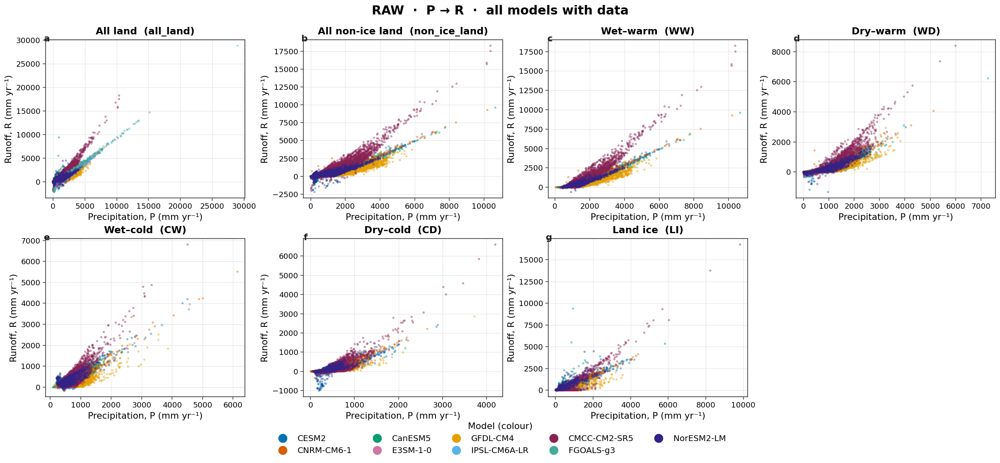


########################################################################
RAW · ET → R
########################################################################

=== RAW · ET → R · all models (63 rows) ===


,model,domain,n_cells,n_removed,removed_fraction,mic,pearson_r_descriptive,group,path_trace
0,CESM2,CD,2325,0,0.000000,0.183700,0.017891,No Global Relationship,MIC:no_global -> No Global Relationship
66,CMCC-CM2-SR5,CD,2289,0,0.000000,0.192700,0.205216,No Global Relationship,MIC:no_global -> No Global Relationship
132,CNRM-CM6-1,CD,1427,0,0.000000,0.331600,0.118165,No Global Relationship,MIC:no_global -> No Global Relationship
198,CanESM5,CD,373,0,0.000000,0.259400,0.077582,No Global Relationship,MIC:no_global -> No Global Relationship
264,E3SM-1-0,CD,0,0,-,-,-,Insufficient data,-
330,FGOALS-g3,CD,0,0,-,-,-,Insufficient data,-
396,GFDL-CM4,CD,2272,0,0.000000,0.237900,0.091963,No Global Relationship,MIC:no_global -> No Global Relationship
462,IPSL-CM6A-LR,CD,0,0,-,-,-,Insufficient data,-
528,NorESM2-LM,CD,592,0,0.000000,0.240700,-0.054641,No Global Relationship,MIC:no_global -> No Global Relationship
12,CESM2,CW,4642,0,0.000000,0.242800,0.093989,No Global Relationship,MIC:no_global -> No Global Relationship


saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_summary_ET_R_raw.csv
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_overlay_ET_R_raw.png


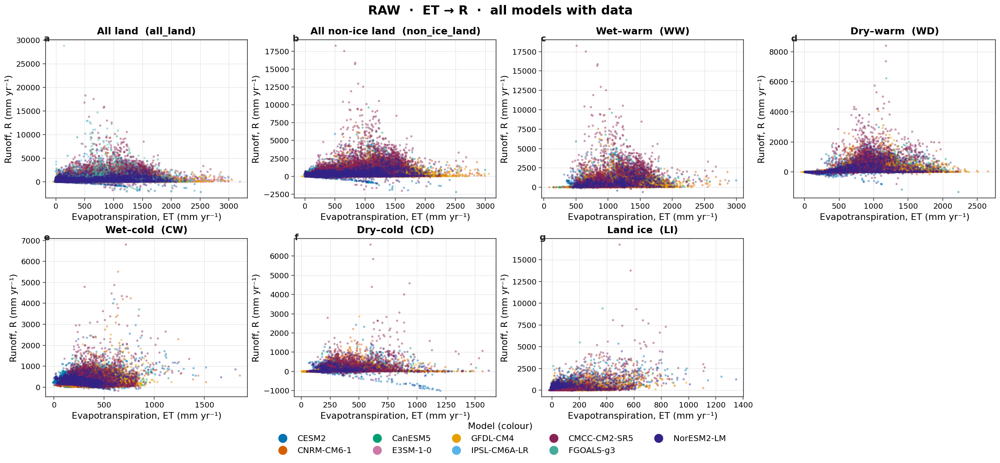


########################################################################
RAW · P → ET
########################################################################

=== RAW · P → ET · all models (63 rows) ===


,model,domain,n_cells,n_removed,removed_fraction,mic,pearson_r_descriptive,group,path_trace
4,CESM2,CD,2325,0,0.000000,0.388900,0.532947,No Global Relationship,MIC:no_global -> No Global Relationship
70,CMCC-CM2-SR5,CD,2289,0,0.000000,0.408300,0.585456,No Global Relationship,MIC:no_global -> No Global Relationship
136,CNRM-CM6-1,CD,1427,0,0.000000,0.490100,0.376598,No Global Relationship,MIC:no_global -> No Global Relationship
202,CanESM5,CD,373,0,0.000000,0.412300,0.385969,No Global Relationship,MIC:no_global -> No Global Relationship
268,E3SM-1-0,CD,0,0,-,-,-,Insufficient data,-
334,FGOALS-g3,CD,0,0,-,-,-,Insufficient data,-
400,GFDL-CM4,CD,2272,0,0.000000,0.569600,0.627938,No Global Relationship,MIC:no_global -> No Global Relationship
466,IPSL-CM6A-LR,CD,0,0,-,-,-,Insufficient data,-
532,NorESM2-LM,CD,592,0,0.000000,0.388500,0.435812,No Global Relationship,MIC:no_global -> No Global Relationship
16,CESM2,CW,4642,0,0.000000,0.297600,0.578882,No Global Relationship,MIC:no_global -> No Global Relationship


saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_summary_P_ET_raw.csv
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_overlay_P_ET_raw.png


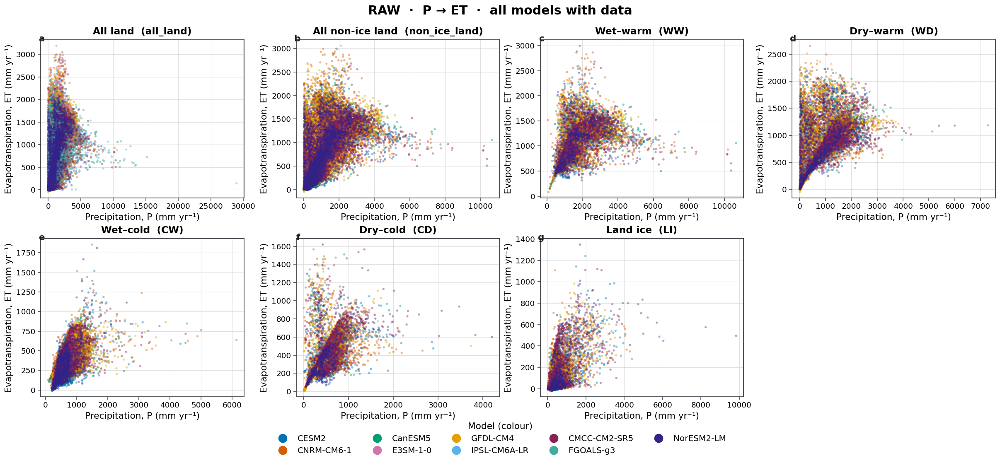

In [6]:
def style_axes(ax):
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('#30343B')
        spine.set_linewidth(1.0)
    ax.tick_params(
        direction='out', length=4.0, width=0.9,
        color='#30343B', labelsize=11,
    )
    ax.grid(True, color='#D3D3D3', linewidth=0.6, alpha=0.7, zorder=0)


UNIT_LABELS = {
    'P': 'Precipitation, P (mm yr⁻¹)',
    'ET': 'Evapotranspiration, ET (mm yr⁻¹)',
    'R': 'Runoff, R (mm yr⁻¹)',
}
PAIR_SLUGS = {
    'P → R': 'P_R',
    'ET → R': 'ET_R',
    'P → ET': 'P_ET',
}
SUMMARY_COLUMNS = [
    'model', 'domain', 'n_cells', 'n_removed', 'removed_fraction',
    'mic', 'pearson_r_descriptive', 'group', 'path_trace',
]
PAIR_FIGURE_DIR = DATA_ROOT / 'S4_pair_summaries'
PAIR_FIGURE_DIR.mkdir(parents=True, exist_ok=True)


def assign_model_colors(model_names):
    ordered = list(dict.fromkeys(model_names))
    return {
        name: MODEL_COLOR_CYCLE[i % len(MODEL_COLOR_CYCLE)]
        for i, name in enumerate(ordered)
    }


MODEL_COLORS = assign_model_colors([run['model'] for run in RUNS])
print('Model colours:')
for name, color in MODEL_COLORS.items():
    print(f'  {name}: {color}')


def padded_limits(values, pad_fraction=0.04):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if len(values) == 0:
        return (-1.0, 1.0)
    lower, upper = float(values.min()), float(values.max())
    span = upper - lower
    if not np.isfinite(span) or span == 0:
        span = max(abs(lower), 1.0)
    pad = pad_fraction * span
    return lower - pad, upper + pad


def lookup_result_row(model, domain_key, x_var, y_var, version):
    rows = RESULTS_DF.loc[
        (RESULTS_DF['model'] == model)
        & (RESULTS_DF['domain'] == domain_key)
        & (RESULTS_DF['sample'] == 'all')
        & (RESULTS_DF['x_var'] == x_var)
        & (RESULTS_DF['y_var'] == y_var)
        & (RESULTS_DF['outlier_version'] == version)
    ]
    if len(rows) != 1:
        return None
    return rows.iloc[0]


def collect_overlay_series(x_var, y_var, domain_key, domain_filter, version):
    """Points for every model that has finite cells in this domain."""
    series = []
    for run in RUNS:
        table = run['clim']
        subset = table if domain_filter is None else table.loc[domain_filter(table)]
        if subset.empty:
            continue
        prepared = prepare_pair_versions(subset[x_var], subset[y_var])
        x_raw, y_raw = prepared['raw']
        if len(x_raw) == 0:
            continue
        x_vals, y_vals = prepared[version]
        keep = prepared['trim_keep']
        series.append({
            'model': run['model'],
            'x': x_vals,
            'y': y_vals,
            'x_raw': x_raw,
            'y_raw': y_raw,
            'trim_keep': keep,
            'xlim_src': x_raw,
            'ylim_src': y_raw,
            'result': lookup_result_row(
                run['model'], domain_key, x_var, y_var, version
            ),
        })
    return series


def pair_summary_table(pair_label, version):
    table = RESULTS_DF.loc[
        (RESULTS_DF['pair'] == pair_label)
        & (RESULTS_DF['outlier_version'] == version)
        & (RESULTS_DF['sample'] == 'all'),
        [c for c in SUMMARY_COLUMNS if c in RESULTS_DF.columns],
    ].copy()
    table = table.sort_values(['domain', 'model'])
    display_table = table.astype(object).where(pd.notna(table), '-').replace('N/A', '-')
    print(
        f'\n=== {version.upper()} · {pair_label} · all models '
        f'({len(display_table)} rows) ==='
    )
    display(
        display_table.style.set_properties(
            **{'text-align': 'left', 'white-space': 'nowrap', 'font-size': '12px'}
        )
    )
    out = PAIR_FIGURE_DIR / f'S4_summary_{PAIR_SLUGS[pair_label]}_{version}.csv'
    if WRITE_OUTPUTS:
        table.to_csv(out, index=False)
        print(f'saved {out}')
    return table


def draw_pair_overlay_figure(x_var, y_var, pair_label, version):
    n_domains = len(DOMAINS)
    n_cols = 4
    n_rows = int(np.ceil(n_domains / n_cols))
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(5 * n_cols, 4 * n_rows),
        constrained_layout=True,
    )
    axes = np.atleast_1d(axes).ravel()

    legend_handles = []
    seen_models = []

    for idx, (domain_key, domain_label, domain_filter) in enumerate(DOMAINS):
        ax = axes[idx]
        series = collect_overlay_series(
            x_var, y_var, domain_key, domain_filter, version
        )
        x_pool, y_pool = [], []
        for item in series:
            x_pool.append(item['xlim_src'])
            y_pool.append(item['ylim_src'])
            color = MODEL_COLORS[item['model']]
            if version == 'trimmed':
                dropped = ~np.asarray(item['trim_keep'], dtype=bool)
                if dropped.any():
                    ax.scatter(
                        item['x_raw'][dropped], item['y_raw'][dropped],
                        marker='x', s=18, c=color, alpha=0.80,
                        linewidths=0.7, zorder=1, rasterized=True,
                    )
            if len(item['x']) > 0:
                ax.scatter(
                    item['x'], item['y'],
                    s=10, c=color, alpha=0.45,
                    edgecolors='none', rasterized=True, zorder=2,
                    label=item['model'],
                )
            if item['model'] not in seen_models:
                seen_models.append(item['model'])
                legend_handles.append(
                    Line2D(
                        [0], [0], marker='o', color='none',
                        markerfacecolor=color, markeredgecolor='none',
                        markersize=10,
                        label=item['model'],
                    )
                )
        if series:
            ax.set_xlim(padded_limits(np.concatenate(x_pool)))
            ax.set_ylim(padded_limits(np.concatenate(y_pool)))
        else:
            ax.text(
                0.5, 0.5, 'No models with data',
                transform=ax.transAxes, ha='center', va='center',
                fontsize=13, color='#6B7280',
            )
        ax.set_title(f'{domain_label}  ({domain_key})', fontsize=14, pad=8)
        ax.set_xlabel(UNIT_LABELS[x_var], fontsize=13)
        ax.set_ylabel(UNIT_LABELS[y_var], fontsize=13)
        style_axes(ax)
        panel_letter = chr(ord('a') + idx)
        ax.text(
            0.02, 0.98, panel_letter,
            transform=ax.transAxes, va='bottom', ha='right',
            fontsize=13, fontweight='bold', color='#222222',
        )

    for ax in axes[n_domains:]:
        ax.set_visible(False)

    fig.suptitle(
        f'{version.upper()}  ·  {pair_label}  ·  all models with data',
        fontsize=18, fontweight='semibold', y=1.05,
    )
    if legend_handles:
        fig.legend(
            handles=legend_handles,
            loc='lower center',
            ncol=min(5, len(legend_handles)),
            bbox_to_anchor=(0.5, -0.1),
            frameon=False,
            fontsize=12,
            markerscale=1.3,
            title='Model (colour)',
            title_fontsize=13,
        )
        if version == 'trimmed':
            fig.legend(
                handles=[
                    Line2D(
                        [0], [0], marker='x', color='#444444',
                        linestyle='none', markersize=8,
                        label='Removed (outside 1st–99th percentile on x or y)',
                    )
                ],
                loc='lower center',
                bbox_to_anchor=(0.5, -0.16),
                frameon=False,
                fontsize=11,
            )
    if WRITE_OUTPUTS:
        path = PAIR_FIGURE_DIR / f'S4_overlay_{PAIR_SLUGS[pair_label]}_{version}.png'
        fig.savefig(path, dpi=180, bbox_inches='tight')
        print(f'saved {path}')
    plt.show()
    plt.close(fig)


print('RAW pair analysis')
print('=' * 72)
for x_var, y_var, pair_label in VARIABLE_PAIRS:
    print('\n' + '#' * 72)
    print(f'RAW · {pair_label}')
    print('#' * 72)
    pair_summary_table(pair_label, 'raw')
    draw_pair_overlay_figure(x_var, y_var, pair_label, 'raw')


## 6b. Pair analysis — TRIMMED / 按变量对（trimmed）

Same tables and multi-model overlays as the raw section, after every raw pair has been shown. Colour is still the model, not the zone.

**中文说明：** 全部 raw 变量对看完后再看 trimmed。颜色仍然只区分模型。

Trimmed panels keep retained cells as circles and mark removed cells with **x**.

**中文说明：** trimmed 图里保留的点仍是圆点，被去掉的点用 x。


TRIMMED pair analysis

########################################################################
TRIMMED · P → R
########################################################################

=== TRIMMED · P → R · all models (63 rows) ===


,model,domain,n_cells,n_removed,removed_fraction,mic,pearson_r_descriptive,group,path_trace
9,CESM2,CD,2247,78,0.033548,0.604000,0.811298,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
75,CMCC-CM2-SR5,CD,2217,72,0.031455,0.512400,0.776857,No Global Relationship,MIC:no_global -> No Global Relationship
141,CNRM-CM6-1,CD,1384,43,0.030133,0.678800,0.877951,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
207,CanESM5,CD,360,13,0.034853,0.621400,0.812246,Acceleration,MIC:intermediate_global -> Pearson:Simple -> Power:Acceleration
273,E3SM-1-0,CD,0,0,-,-,-,Insufficient data,-
339,FGOALS-g3,CD,0,0,-,-,-,Insufficient data,-
405,GFDL-CM4,CD,2205,67,0.029489,0.360400,0.616662,No Global Relationship,MIC:no_global -> No Global Relationship
471,IPSL-CM6A-LR,CD,0,0,-,-,-,Insufficient data,-
537,NorESM2-LM,CD,573,19,0.032095,0.591300,0.749826,No Global Relationship,MIC:no_global -> No Global Relationship
21,CESM2,CW,4494,148,0.031883,0.369600,0.765156,No Global Relationship,MIC:no_global -> No Global Relationship


saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_summary_P_R_trimmed.csv
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_overlay_P_R_trimmed.png


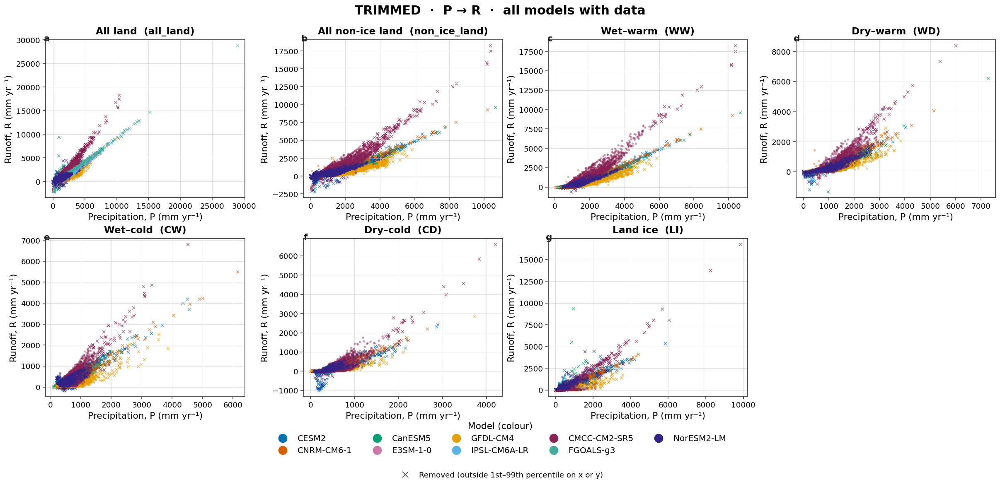


########################################################################
TRIMMED · ET → R
########################################################################

=== TRIMMED · ET → R · all models (63 rows) ===


,model,domain,n_cells,n_removed,removed_fraction,mic,pearson_r_descriptive,group,path_trace
1,CESM2,CD,2241,84,0.036129,0.176500,0.202946,No Global Relationship,MIC:no_global -> No Global Relationship
67,CMCC-CM2-SR5,CD,2197,92,0.040192,0.180900,0.172790,No Global Relationship,MIC:no_global -> No Global Relationship
133,CNRM-CM6-1,CD,1372,55,0.038542,0.308500,0.159627,No Global Relationship,MIC:no_global -> No Global Relationship
199,CanESM5,CD,358,15,0.040214,0.241800,0.075074,No Global Relationship,MIC:no_global -> No Global Relationship
265,E3SM-1-0,CD,0,0,-,-,-,Insufficient data,-
331,FGOALS-g3,CD,0,0,-,-,-,Insufficient data,-
397,GFDL-CM4,CD,2196,76,0.033451,0.225600,0.095551,No Global Relationship,MIC:no_global -> No Global Relationship
463,IPSL-CM6A-LR,CD,0,0,-,-,-,Insufficient data,-
529,NorESM2-LM,CD,569,23,0.038851,0.222900,0.048461,No Global Relationship,MIC:no_global -> No Global Relationship
13,CESM2,CW,4471,171,0.036838,0.232400,-0.072997,No Global Relationship,MIC:no_global -> No Global Relationship


saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_summary_ET_R_trimmed.csv
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_overlay_ET_R_trimmed.png


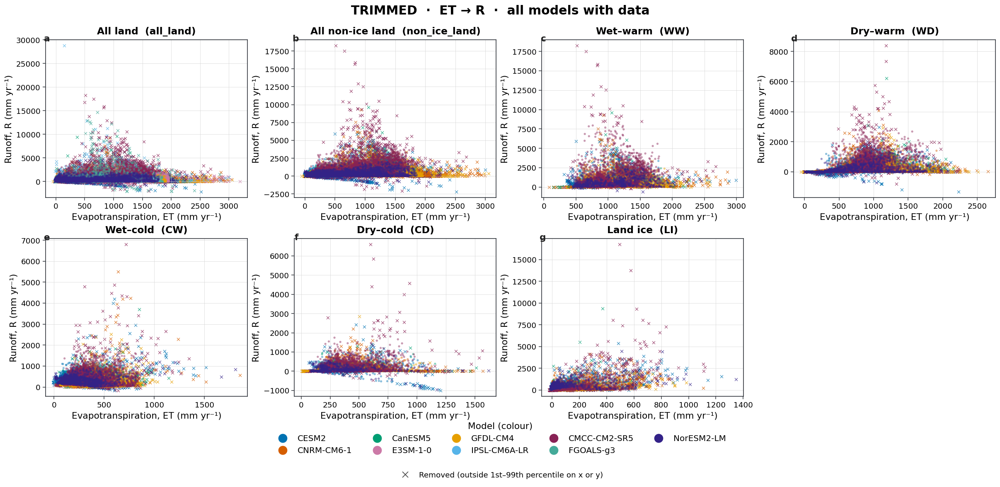


########################################################################
TRIMMED · P → ET
########################################################################

=== TRIMMED · P → ET · all models (63 rows) ===


,model,domain,n_cells,n_removed,removed_fraction,mic,pearson_r_descriptive,group,path_trace
5,CESM2,CD,2235,90,0.038710,0.385900,0.610566,No Global Relationship,MIC:no_global -> No Global Relationship
71,CMCC-CM2-SR5,CD,2214,75,0.032765,0.401600,0.658098,No Global Relationship,MIC:no_global -> No Global Relationship
137,CNRM-CM6-1,CD,1379,48,0.033637,0.479300,0.457183,No Global Relationship,MIC:no_global -> No Global Relationship
203,CanESM5,CD,361,12,0.032172,0.418100,0.384242,No Global Relationship,MIC:no_global -> No Global Relationship
269,E3SM-1-0,CD,0,0,-,-,-,Insufficient data,-
335,FGOALS-g3,CD,0,0,-,-,-,Insufficient data,-
401,GFDL-CM4,CD,2199,73,0.032130,0.568400,0.710104,No Global Relationship,MIC:no_global -> No Global Relationship
467,IPSL-CM6A-LR,CD,0,0,-,-,-,Insufficient data,-
533,NorESM2-LM,CD,570,22,0.037162,0.379200,0.508225,No Global Relationship,MIC:no_global -> No Global Relationship
17,CESM2,CW,4490,152,0.032745,0.275700,0.537863,No Global Relationship,MIC:no_global -> No Global Relationship


saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_summary_P_ET_trimmed.csv
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_overlay_P_ET_trimmed.png


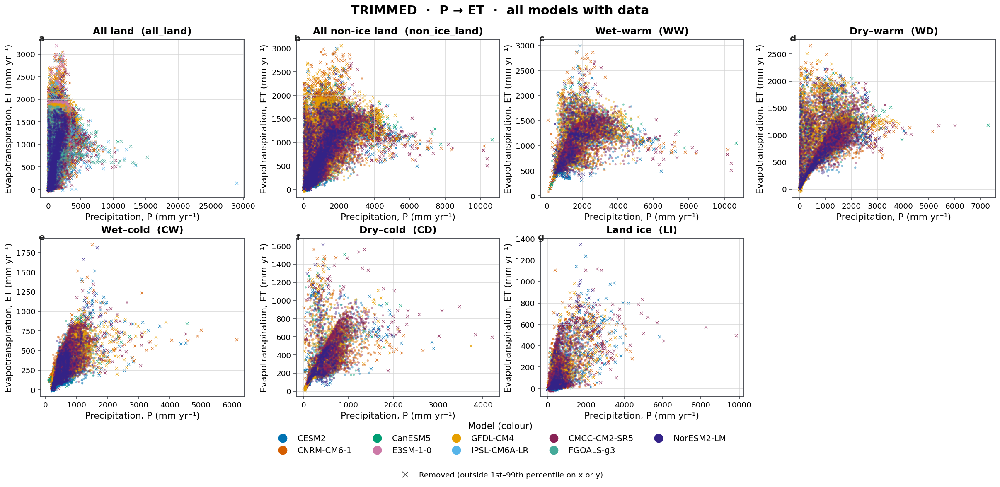

In [7]:
print('TRIMMED pair analysis')
print('=' * 72)
for x_var, y_var, pair_label in VARIABLE_PAIRS:
    print('\n' + '#' * 72)
    print(f'TRIMMED · {pair_label}')
    print('#' * 72)
    pair_summary_table(pair_label, 'trimmed')
    draw_pair_overlay_figure(x_var, y_var, pair_label, 'trimmed')


## 6c. Per-model scatter plots — RAW / 单模型散点（raw）

Keep the original one-model figures: three variable-pair rows × seven domain columns. These sit **after** the multi-model pair overlays, they are not replaced by them. The all-non-ice-land column is coloured by climate zone; land ice is the last column in blue.

**中文说明：** 保留原来的单模型总图（三行变量对 × 七列域）。多模型总图在前面，这里不删。非冰陆地按四区着色，冰盖最后一列蓝点。


In [8]:
N_EQUAL_COUNT_BINS = CLASSIFIER_DEFAULTS['branch_n_bins']


def equal_count_bin_medians(x, y, n_bins=N_EQUAL_COUNT_BINS):
    frame = pd.DataFrame({'x': x, 'y': y}).replace(
        [np.inf, -np.inf], np.nan
    ).dropna()
    if len(frame) < 2 or frame['x'].nunique() < 2:
        return pd.DataFrame(columns=['x', 'y', 'n'])
    q = min(int(n_bins), int(frame['x'].nunique()))
    frame['bin'] = pd.qcut(frame['x'], q=q, duplicates='drop')
    curve = frame.groupby('bin', observed=True).agg(
        x=('x', 'median'), y=('y', 'median'), n=('y', 'size')
    ).reset_index(drop=True)
    return curve.sort_values('x')


def draw_power_fit(ax, result_row, x_values):
    needed = ['power_a', 'power_b', 'power_c', 'power_r2']
    if any(pd.isna(result_row.get(name, np.nan)) for name in needed):
        return False
    positive_x = np.asarray(x_values, dtype=float)
    positive_x = positive_x[np.isfinite(positive_x) & (positive_x > 1e-6)]
    if len(positive_x) < 2:
        return False
    x_fit = np.linspace(positive_x.min(), positive_x.max(), 350)
    a = float(result_row['power_a'])
    b = float(result_row['power_b'])
    c = float(result_row['power_c'])
    y_fit = a * np.power(np.maximum(x_fit, 1e-10), b) + c
    ax.plot(
        x_fit, y_fit, color='#B12A68', linewidth=1.8,
        linestyle=(0, (5, 3)), zorder=5,
    )
    return True


def metric_text(row, column):
    value = row.get(column, np.nan)
    return f'{value:.3f}' if pd.notna(value) else '—'


def display_class(group):
    return {
        'No Global Relationship': 'No global relationship',
    }.get(str(group), str(group))


def classification_facecolor(group):
    if group is None:
        return '#FFFFFF'
    try:
        if isinstance(group, float) and np.isnan(group):
            return '#FFFFFF'
    except TypeError:
        pass
    key = str(group)
    if key in CLASS_FACECOLORS:
        return CLASS_FACECOLORS[key]
    return CLASS_FACECOLORS.get(display_class(key), '#FFFFFF')


def format_panel_annotation(result_row, version, raw_row=None):
    """Return (class_name, detail_text). Class is drawn bold; no 'Final class' prefix."""
    if result_row is None:
        return 'No result', ''
    final_class = display_class(result_row['group'])
    if final_class in {'', 'nan', 'None'}:
        final_class = 'No result'
    details = (
        f"MIC={metric_text(result_row, 'mic')}  |  "
        f"r={metric_text(result_row, 'pearson_r_descriptive')}\n"
        f"n={int(result_row['n_cells'])}"
    )
    if version == 'trimmed':
        details += (
            f"  |  rem={int(result_row['n_removed'])} "
            f"({100 * float(result_row['removed_fraction']):.1f}%)"
        )
        if raw_row is not None and raw_row['group'] != result_row['group']:
            details += (
                f"\n{display_class(raw_row['group'])} → {final_class}"
            )
    if pd.notna(result_row.get('power_r2', np.nan)):
        details += (
            f"\nPower: R²={float(result_row['power_r2']):.3f}  "
            f"b={float(result_row['power_b']):.3f}"
        )
    return final_class, details


def draw_class_annotation(ax, class_name, details, *, fontsize=9.2, y=0.96):
    """Bold class name, then metrics — one box, no overlapping text."""
    from matplotlib.offsetbox import AnnotationBbox, TextArea, VPacker

    title = TextArea(
        class_name,
        textprops={
            'fontsize': fontsize + 0.8,
            'fontweight': 'bold',
            'color': '#111111',
            'family': 'DejaVu Sans',
        },
    )
    children = [title]
    if details:
        children.append(
            TextArea(
                details,
                textprops={
                    'fontsize': fontsize,
                    'fontweight': 'normal',
                    'color': '#202020',
                    'family': 'DejaVu Sans',
                },
            )
        )
    pack = VPacker(children=children, align='left', pad=0, sep=3)
    box = AnnotationBbox(
        pack,
        (0.03, y),
        xycoords='axes fraction',
        box_alignment=(0.0, 1.0),
        frameon=True,
        pad=0.30,
        bboxprops={
            'boxstyle': 'round,pad=0.35',
            'facecolor': 'white',
            'edgecolor': '#C9C9C9',
            'alpha': 0.92,
        },
        zorder=8,
    )
    ax.add_artist(box)


def scatter_points(ax, x_data, y_data, domain_key, groups,
                   dropped=None, dropped_groups=None):
    if dropped is not None:
        xd, yd = dropped
        if len(xd) > 0:
            if domain_key == 'non_ice_land' and dropped_groups is not None:
                dcolors = [ZONE_COLORS.get(str(z), '#B0B0B0') for z in dropped_groups]
                ax.scatter(
                    xd, yd, marker='x', s=16, c=dcolors, alpha=0.85,
                    linewidths=0.7, zorder=1, rasterized=True,
                )
            else:
                ax.scatter(
                    xd, yd, marker='x', s=16,
                    color=ZONE_COLORS.get(domain_key, '#555555'),
                    alpha=0.85, linewidths=0.7, zorder=1, rasterized=True,
                )
    if len(x_data) == 0:
        if dropped is None or len(dropped[0]) == 0:
            ax.text(
                0.5, 0.5, 'Unavailable', transform=ax.transAxes,
                ha='center', va='center', fontsize=12, color='#6B7280',
            )
        return
    if domain_key == 'non_ice_land' and groups is not None:
        colors = [ZONE_COLORS.get(str(z), '#B0B0B0') for z in groups]
        ax.scatter(
            x_data, y_data, s=7, c=colors, alpha=0.55,
            edgecolors='none', rasterized=True, zorder=2,
        )
        return
    color = ZONE_COLORS.get(domain_key, '#555555')
    size = 8 if domain_key == 'LI' else 7
    ax.scatter(
        x_data, y_data, s=size, color=color, alpha=0.55,
        edgecolors='none', rasterized=True, zorder=2,
    )


def build_panel_payloads(run):
    t = run['clim']
    payloads = {}
    for x_var, y_var, pair_label in VARIABLE_PAIRS:
        for domain_key, domain_label, domain_filter in DOMAINS:
            subset = t.loc[domain_filter(t)] if domain_filter is not None else t
            prepared = prepare_pair_versions(
                subset[x_var], subset[y_var],
                groups=subset['analysis_zone'] if 'analysis_zone' in subset else None,
            )
            x_raw, y_raw = prepared['raw']
            result_rows = RESULTS_DF.loc[
                (RESULTS_DF['model'] == run['model'])
                & (RESULTS_DF['experiment'] == run['experiment'])
                & (RESULTS_DF['member'] == run['member'])
                & (RESULTS_DF['grid'] == run['grid'])
                & (RESULTS_DF['domain'] == domain_key)
                & (RESULTS_DF['sample'] == 'all')
                & (RESULTS_DF['x_var'] == x_var)
                & (RESULTS_DF['y_var'] == y_var)
            ]
            payloads[(pair_label, domain_key)] = {
                'x_var': x_var,
                'y_var': y_var,
                'pair_label': pair_label,
                'domain_key': domain_key,
                'domain_label': domain_label,
                'prepared': prepared,
                'result_rows': result_rows,
                'xlim': padded_limits(x_raw),
                'ylim': padded_limits(y_raw),
            }
    return payloads


def draw_relationship_figure(run, version, panel_payloads):
    n_rows = len(VARIABLE_PAIRS)
    n_cols = len(DOMAINS)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(3.9 * n_cols, 4.15 * n_rows),
        constrained_layout=True, squeeze=False,
    )

    for row_i, (x_var, y_var, pair_label) in enumerate(VARIABLE_PAIRS):
        for col_i, (domain_key, domain_label, _) in enumerate(DOMAINS):
            ax = axes[row_i, col_i]
            payload = panel_payloads[(pair_label, domain_key)]
            x_data, y_data = payload['prepared'][version]
            groups = payload['prepared'][f'{version}_groups']
            dropped = None
            dropped_groups = None
            if version == 'trimmed':
                keep = np.asarray(payload['prepared']['trim_keep'], dtype=bool)
                x_raw, y_raw = payload['prepared']['raw']
                dropped = (x_raw[~keep], y_raw[~keep])
                g_raw = payload['prepared']['raw_groups']
                if g_raw is not None:
                    dropped_groups = g_raw[~keep]
            scatter_points(
                ax, x_data, y_data, domain_key, groups,
                dropped=dropped, dropped_groups=dropped_groups,
            )

            bin_curve = equal_count_bin_medians(x_data, y_data)
            if len(bin_curve) >= 2:
                ax.plot(
                    bin_curve['x'], bin_curve['y'],
                    color='white', linewidth=4.2, zorder=3,
                )
                ax.plot(
                    bin_curve['x'], bin_curve['y'],
                    color='#20252B', linewidth=2.0, marker='o',
                    markersize=3.4, markerfacecolor='white',
                    markeredgecolor='#20252B', markeredgewidth=0.8,
                    zorder=4,
                )

            version_rows = payload['result_rows'].loc[
                payload['result_rows']['outlier_version'] == version
            ]
            raw_rows = payload['result_rows'].loc[
                payload['result_rows']['outlier_version'] == 'raw'
            ]
            if len(version_rows) == 1:
                result_row = version_rows.iloc[0]
                raw_row = raw_rows.iloc[0] if len(raw_rows) == 1 else None
                draw_power_fit(ax, result_row, x_data)
                class_name, details = format_panel_annotation(
                    result_row, version, raw_row=raw_row
                )
            else:
                class_name, details = 'No result', ''
            draw_class_annotation(ax, class_name, details, fontsize=9.2)
            ax.set_xlim(payload['xlim'])
            ax.set_ylim(payload['ylim'])
            if row_i == 0:
                ax.set_title(
                    f'{domain_label}\n({domain_key})',
                    fontsize=12, fontweight='semibold', pad=8,
                )
            ax.set_xlabel(UNIT_LABELS[x_var], fontsize=10)
            ax.set_ylabel(
                UNIT_LABELS[y_var] if col_i == 0 else '',
                fontsize=10,
            )
            if col_i == 0:
                ax.text(
                    -0.24, 0.5, pair_label,
                    transform=ax.transAxes, rotation=90,
                    va='center', ha='center',
                    fontsize=13, fontweight='bold', color='#222222',
                )
            ax.text(
                0.98, 0.02, chr(ord('a') + row_i * n_cols + col_i),
                transform=ax.transAxes, va='bottom', ha='right',
                fontsize=11, fontweight='bold', color='#444444',
            )
            style_axes(ax)
            face = '#FFFFFF'
            if len(version_rows) == 1:
                face = classification_facecolor(version_rows.iloc[0]['group'])
            ax.set_facecolor(face)

    fig.suptitle(
        f"{version.upper()} per-model  ·  {run['model']}  ·  "
        f"{START_YEAR}–{END_YEAR}",
        fontsize=16, fontweight='semibold',
    )
    legend_handles = [
        Line2D(
            [0], [0], color='#20252B', linewidth=2.0, marker='o',
            markersize=4, markerfacecolor='white',
            label=f'Median trend ({N_EQUAL_COUNT_BINS} equal-count bins)',
        ),
        Line2D(
            [0], [0], color='#B12A68', linewidth=1.8,
            linestyle=(0, (5, 3)),
            label='Power-law fit (when fitted)',
        ),
        Line2D(
            [0], [0], marker='x', color='#444444', linestyle='none',
            markersize=8,
            label='Removed in trimmed (outside 1st–99th percentile)',
        ),
    ]
    for key, label in ZONE_LEGEND:
        legend_handles.append(
            Line2D(
                [0], [0], marker='o', color='none',
                markerfacecolor=ZONE_COLORS[key], markeredgecolor='none',
                markersize=8, label=label,
            )
        )
    fig.legend(
        handles=legend_handles,
        loc='lower right',
        bbox_to_anchor=(0.995, -0.02),
        ncol=2,
        frameon=True,
        fancybox=False,
        edgecolor='#C9C9C9',
        fontsize=11,
        framealpha=0.95,
    )
    if WRITE_OUTPUTS:
        fig.savefig(
            run['zones_dir'] / f'S4_relationships_{version}.png',
            dpi=180, bbox_inches='tight',
        )
    plt.show()
    plt.close(fig)


# print('Per-model RAW scatter plots')
# print('=' * 72)
# for run in RUNS:
#     payloads = build_panel_payloads(run)
#     run['panel_payloads'] = payloads
#     draw_relationship_figure(run, 'raw', payloads)


## 6d. Per-model scatter plots — TRIMMED / 单模型散点（trimmed）

Same 3 × 7 per-model layout as the raw figures above.

**中文说明：** 与上一节单模型图相同，仅在全部 raw 单模型图之后显示 trimmed。

Trimmed panels keep retained cells as circles and mark removed cells with **x**.

**中文说明：** trimmed 图里保留的点仍是圆点，被去掉的点用 x。


In [9]:
# print('Per-model TRIMMED scatter plots')
# print('=' * 72)
# for run in RUNS:
#     payloads = run.get('panel_payloads')
#     if payloads is None:
#         payloads = build_panel_payloads(run)
#         run['panel_payloads'] = payloads
#     draw_relationship_figure(run, 'trimmed', payloads)


## 6e. Model × zone grid — RAW / 模型×分区总图（raw）

One figure per variable pair. **Rows are models, columns are domains.** Each panel is that model's cells in that zone. Empty domains (no ice field, etc.) stay blank.

**中文说明：** 每个变量对一张图。一行一个模型，一列一个分区。
Models with no cells in a domain are left out of this overview (e.g. no `sftgif`, so WW–CD and ice are empty).

**中文说明：** 总图不画空模型：没有该分区格点的模型整行去掉（如缺冰盖场、四区为空的那些）。


Model × zone grids — RAW

RAW grid · P → R
  omit empty models from overview: E3SM-1-0, IPSL-CM6A-LR, FGOALS-g3
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_modelgrid_P_R_raw.png


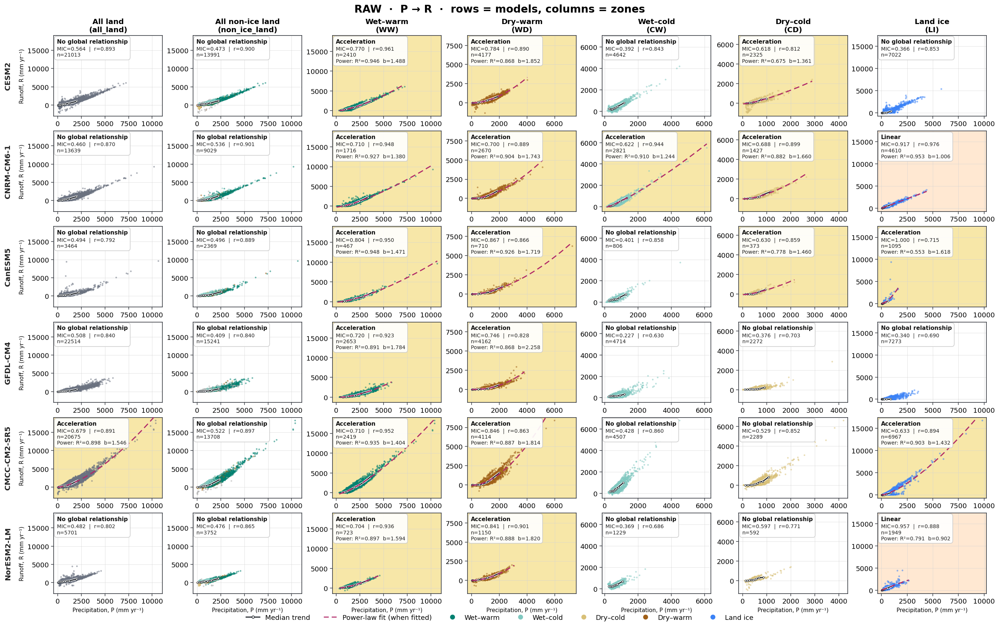


RAW grid · ET → R
  omit empty models from overview: E3SM-1-0, IPSL-CM6A-LR, FGOALS-g3
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_modelgrid_ET_R_raw.png


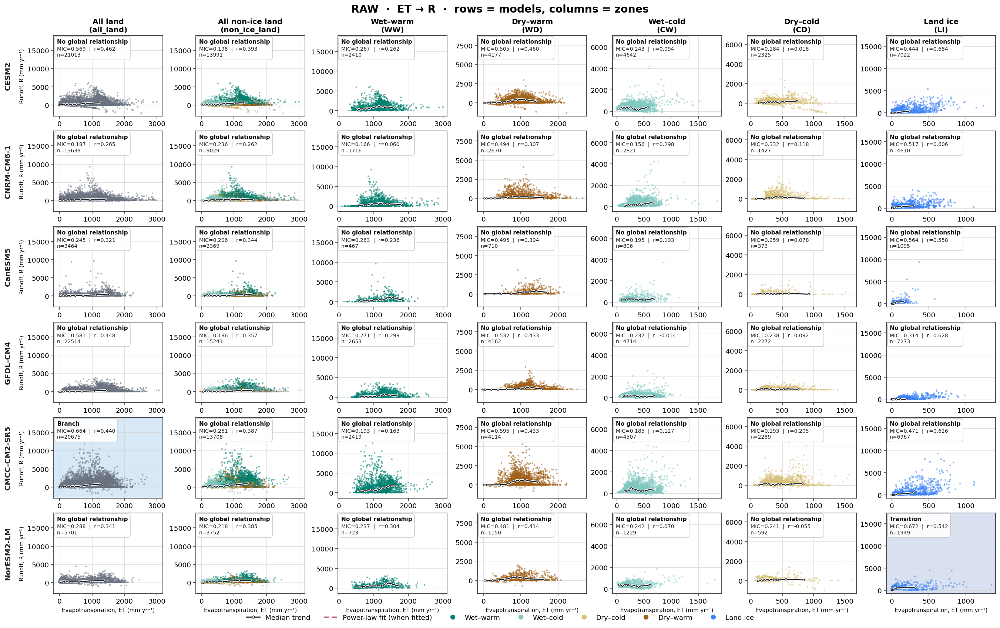


RAW grid · P → ET
  omit empty models from overview: E3SM-1-0, IPSL-CM6A-LR, FGOALS-g3
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_modelgrid_P_ET_raw.png


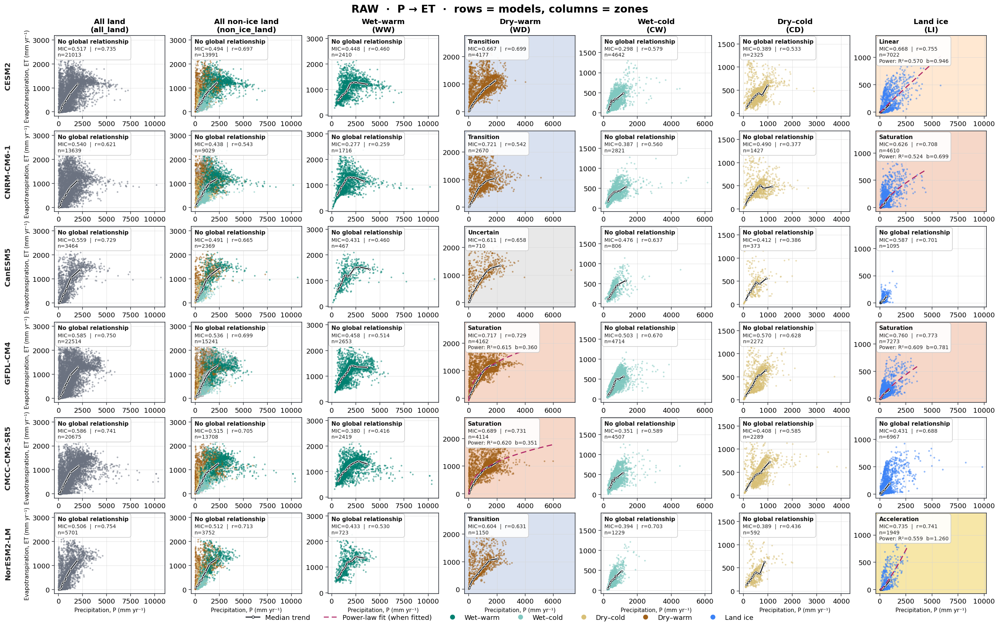

In [10]:
def _ensure_payloads(run):
    payloads = run.get('panel_payloads')
    if payloads is None:
        payloads = build_panel_payloads(run)
        run['panel_payloads'] = payloads
    return payloads


def _raw_count(run, pair_label, domain_key):
    payload = _ensure_payloads(run).get((pair_label, domain_key))
    if payload is None:
        return 0
    return len(payload['prepared']['raw'][0])


def column_limits_for_pair(pair_label, domain_key, runs):
    xs, ys = [], []
    for run in runs:
        payload = _ensure_payloads(run).get((pair_label, domain_key))
        if payload is None:
            continue
        x_raw, y_raw = payload['prepared']['raw']
        if len(x_raw) == 0:
            continue
        xs.append(x_raw)
        ys.append(y_raw)
    if not xs:
        return (-1.0, 1.0), (-1.0, 1.0)
    return padded_limits(np.concatenate(xs)), padded_limits(np.concatenate(ys))


def select_grid_runs(pair_label):
    """Drop models with no cells in any domain on this pair."""
    keep, skipped = [], []
    for run in RUNS:
        n_any = sum(
            _raw_count(run, pair_label, domain_key)
            for domain_key, _, _ in DOMAINS
        )
        n_not_all_land = sum(
            _raw_count(run, pair_label, domain_key)
            for domain_key, _, _ in DOMAINS
            if domain_key != 'all_land'
        )
        # Unknown-ice models only fill All land; omit them from this overview.
        if n_not_all_land == 0:
            skipped.append(run['model'])
            continue
        if n_any == 0:
            skipped.append(run['model'])
            continue
        keep.append(run)
    if skipped:
        print(
            f'  omit empty models from overview: {", ".join(skipped)}'
        )
    return keep


def select_grid_domains(pair_label, runs):
    """Drop domain columns where none of the kept models have points."""
    keep = []
    for domain in DOMAINS:
        if any(_raw_count(run, pair_label, domain[0]) > 0 for run in runs):
            keep.append(domain)
    return keep


def draw_model_zone_grid(x_var, y_var, pair_label, version):
    grid_runs = select_grid_runs(pair_label)
    grid_domains = select_grid_domains(pair_label, grid_runs)
    n_rows = len(grid_runs)
    n_cols = len(grid_domains)
    if n_rows == 0 or n_cols == 0:
        print(f'No models with data for {pair_label} {version}')
        return

    col_limits = {
        domain_key: column_limits_for_pair(pair_label, domain_key, grid_runs)
        for domain_key, _, _ in grid_domains
    }

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(3.2 * n_cols, 2.3 * n_rows),
        constrained_layout=True,
        squeeze=False,
    )

    for row_i, run in enumerate(grid_runs):
        payloads = _ensure_payloads(run)

        for col_i, (domain_key, domain_label, _) in enumerate(grid_domains):
            ax = axes[row_i, col_i]
            payload = payloads[(pair_label, domain_key)]
            x_data, y_data = payload['prepared'][version]
            groups = payload['prepared'][f'{version}_groups']
            dropped = None
            dropped_groups = None
            if version == 'trimmed':
                keep = np.asarray(payload['prepared']['trim_keep'], dtype=bool)
                x_raw, y_raw = payload['prepared']['raw']
                dropped = (x_raw[~keep], y_raw[~keep])
                g_raw = payload['prepared']['raw_groups']
                if g_raw is not None:
                    dropped_groups = g_raw[~keep]
            scatter_points(
                ax, x_data, y_data, domain_key, groups,
                dropped=dropped, dropped_groups=dropped_groups,
            )

            bin_curve = equal_count_bin_medians(x_data, y_data)
            if len(bin_curve) >= 2:
                ax.plot(
                    bin_curve['x'], bin_curve['y'],
                    color='white', linewidth=3.6, zorder=3,
                )
                ax.plot(
                    bin_curve['x'], bin_curve['y'],
                    color='#20252B', linewidth=1.7, marker='o',
                    markersize=2.8, markerfacecolor='white',
                    markeredgecolor='#20252B', markeredgewidth=0.7,
                    zorder=4,
                )

            version_rows = payload['result_rows'].loc[
                payload['result_rows']['outlier_version'] == version
            ]
            raw_rows = payload['result_rows'].loc[
                payload['result_rows']['outlier_version'] == 'raw'
            ]
            if len(version_rows) == 1:
                result_row = version_rows.iloc[0]
                raw_row = raw_rows.iloc[0] if len(raw_rows) == 1 else None
                draw_power_fit(ax, result_row, x_data)
                class_name, details = format_panel_annotation(
                    result_row, version, raw_row=raw_row
                )
            else:
                class_name, details = 'No result', ''
            draw_class_annotation(ax, class_name, details, fontsize=8.4)

            xlim, ylim = col_limits[domain_key]
            ax.set_xlim(xlim)
            ax.set_ylim(ylim)
            style_axes(ax)
            face = '#FFFFFF'
            if len(version_rows) == 1:
                face = classification_facecolor(version_rows.iloc[0]['group'])
            ax.set_facecolor(face)

            if row_i == 0:
                ax.set_title(
                    f'{domain_label}\n({domain_key})',
                    fontsize=12, fontweight='semibold', pad=6,
                )
            if col_i == 0:
                ax.set_ylabel(UNIT_LABELS[y_var], fontsize=9)
                ax.text(
                    -0.42, 0.5, run['model'],
                    transform=ax.transAxes, rotation=90,
                    va='center', ha='center',
                    fontsize=12, fontweight='bold', color='#222222',
                )
            if row_i == n_rows - 1:
                ax.set_xlabel(UNIT_LABELS[x_var], fontsize=9)

    fig.suptitle(
        f'{version.upper()}  ·  {pair_label}  ·  rows = models, columns = zones',
        fontsize=17, fontweight='semibold',
    )
    legend_handles = [
        Line2D(
            [0], [0], color='#20252B', linewidth=1.7, marker='o',
            markersize=4, markerfacecolor='white',
            label='Median trend',
        ),
        Line2D(
            [0], [0], color='#B12A68', linewidth=1.6,
            linestyle=(0, (5, 3)),
            label='Power-law fit (when fitted)',
        ),
    ]
    for key, label in ZONE_LEGEND:
        legend_handles.append(
            Line2D(
                [0], [0], marker='o', color='none',
                markerfacecolor=ZONE_COLORS[key], markeredgecolor='none',
                markersize=8, label=label,
            )
        )
    if version == 'trimmed':
        legend_handles.append(
            Line2D(
                [0], [0], marker='x', color='#444444', linestyle='none',
                markersize=8, label='Removed (1st–99th percentile)',
            )
        )
    fig.legend(
        handles=legend_handles,
        loc='lower right',
        bbox_to_anchor=(0.995, -0.02),
        ncol=2,
        frameon=True,
        fancybox=False,
        edgecolor='#C9C9C9',
        fontsize=11,
        framealpha=0.95,
    )
    if WRITE_OUTPUTS:
        path = PAIR_FIGURE_DIR / (
            f'S4_modelgrid_{PAIR_SLUGS[pair_label]}_{version}.png'
        )
        fig.savefig(path, dpi=160, bbox_inches='tight')
        print(f'saved {path}')
    plt.show()
    plt.close(fig)


print('Model × zone grids — RAW')
print('=' * 72)
for x_var, y_var, pair_label in VARIABLE_PAIRS:
    print(f'\nRAW grid · {pair_label}')
    draw_model_zone_grid(x_var, y_var, pair_label, 'raw')


## 6f. Model × zone grid — TRIMMED / 模型×分区总图（trimmed）

Same rows (models) and columns (zones) as the raw grids. Removed cells are marked with **x**.

**中文说明：** 布局与 raw 相同；被去掉的点用 x。


Model × zone grids — TRIMMED

TRIMMED grid · P → R
  omit empty models from overview: E3SM-1-0, IPSL-CM6A-LR, FGOALS-g3
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_modelgrid_P_R_trimmed.png


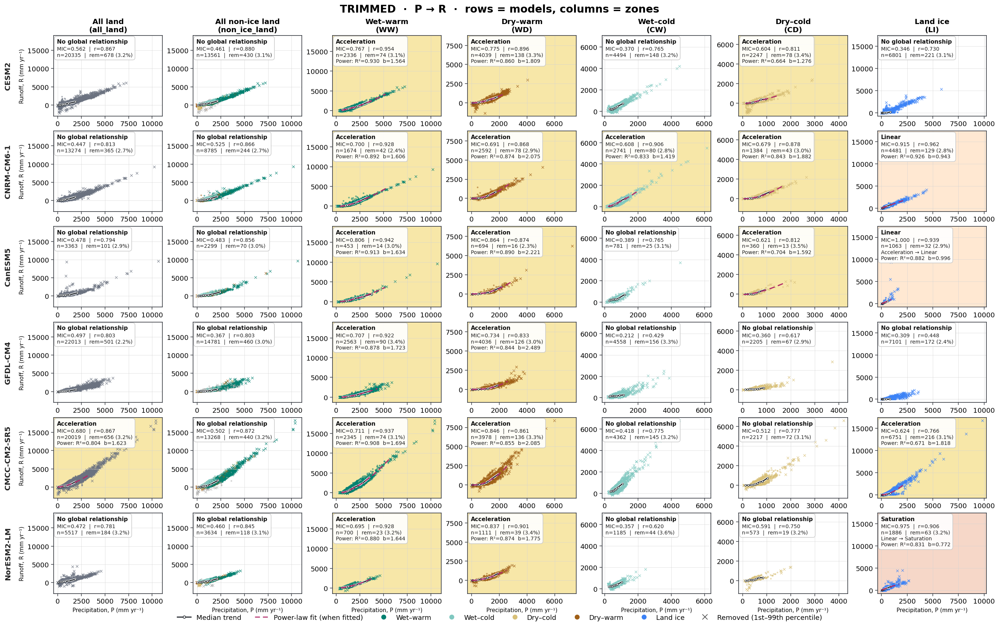


TRIMMED grid · ET → R
  omit empty models from overview: E3SM-1-0, IPSL-CM6A-LR, FGOALS-g3
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_modelgrid_ET_R_trimmed.png


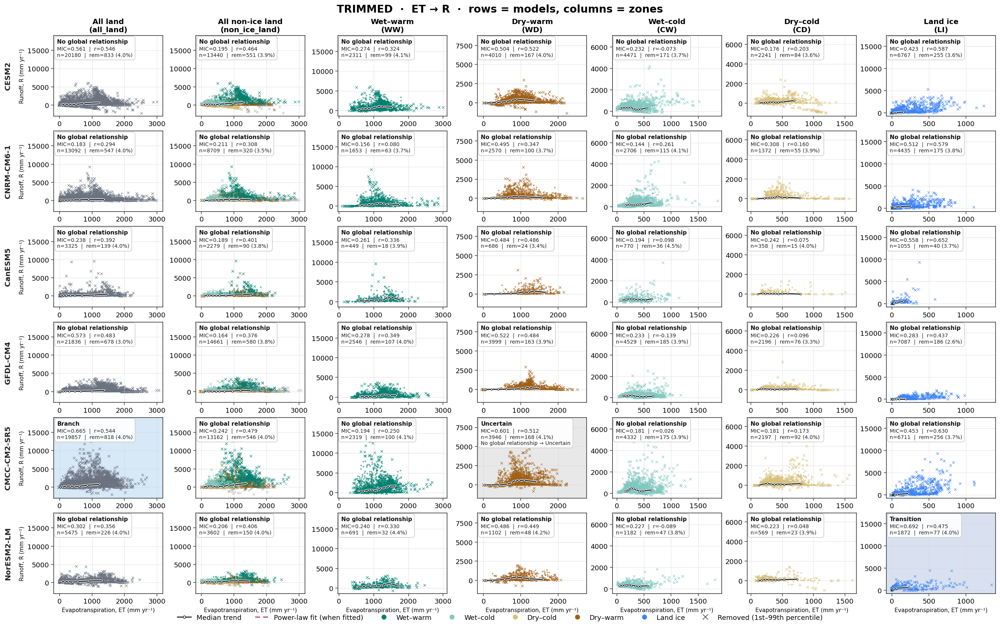


TRIMMED grid · P → ET
  omit empty models from overview: E3SM-1-0, IPSL-CM6A-LR, FGOALS-g3
saved /Volumes/mimi-T9/CMIP6/S4_pair_summaries/S4_modelgrid_P_ET_trimmed.png


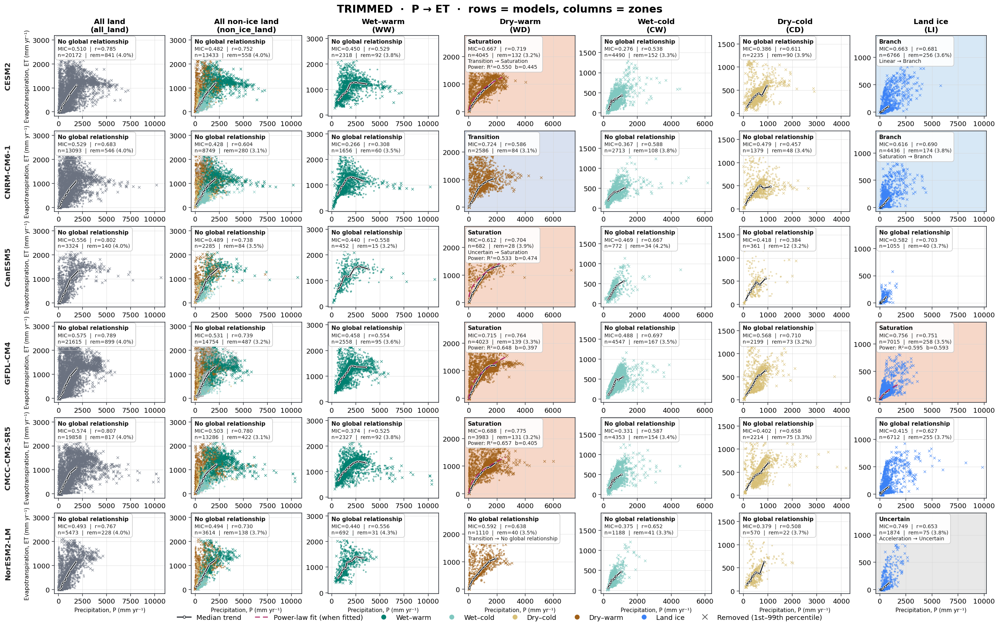

In [11]:
print('Model × zone grids — TRIMMED')
print('=' * 72)
for x_var, y_var, pair_label in VARIABLE_PAIRS:
    print(f'\nTRIMMED grid · {pair_label}')
    draw_model_zone_grid(x_var, y_var, pair_label, 'trimmed')


## 7. Classification heatmap — RAW / raw分类热力图

One heatmap per model for **raw** classifications (domain × variable pair). Trimmed heatmaps follow in the next section.

**中文说明：** 每个模型先画一张raw热力图；全部raw热力图完成后再画trimmed。


RAW classification heatmaps


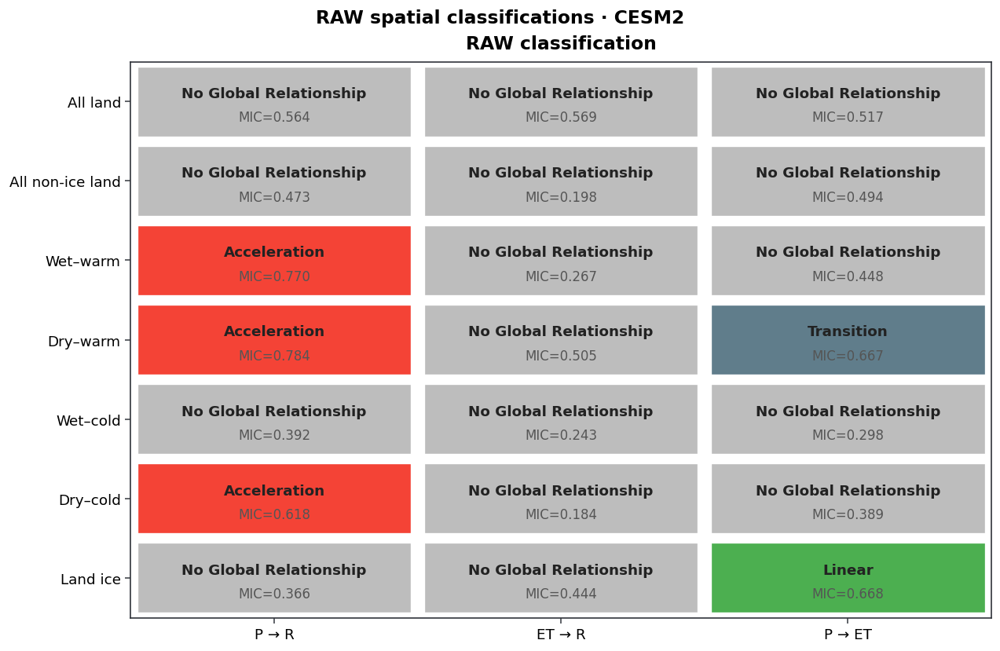

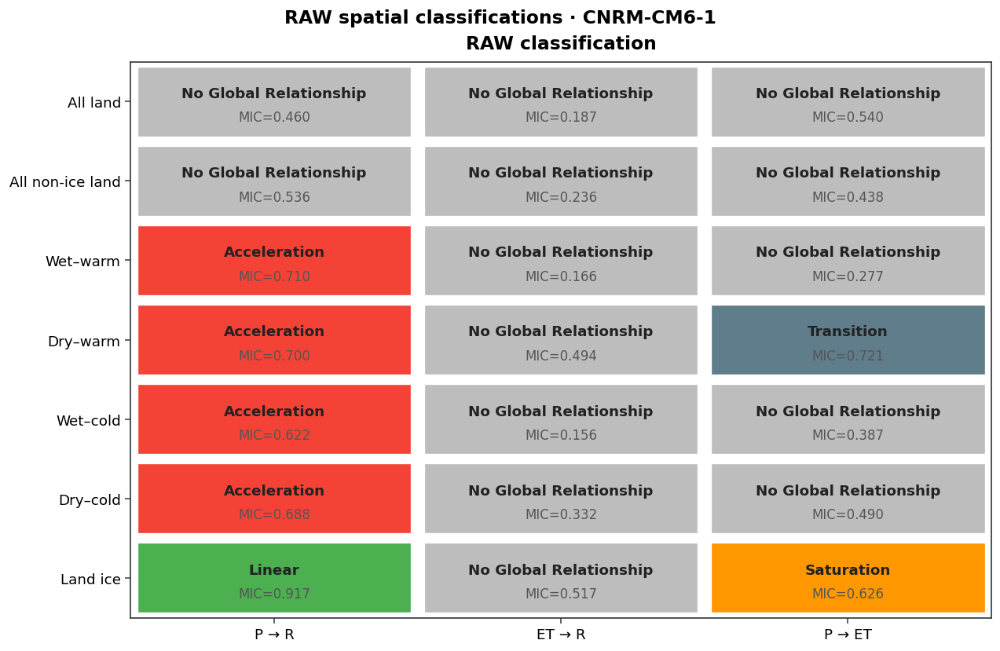

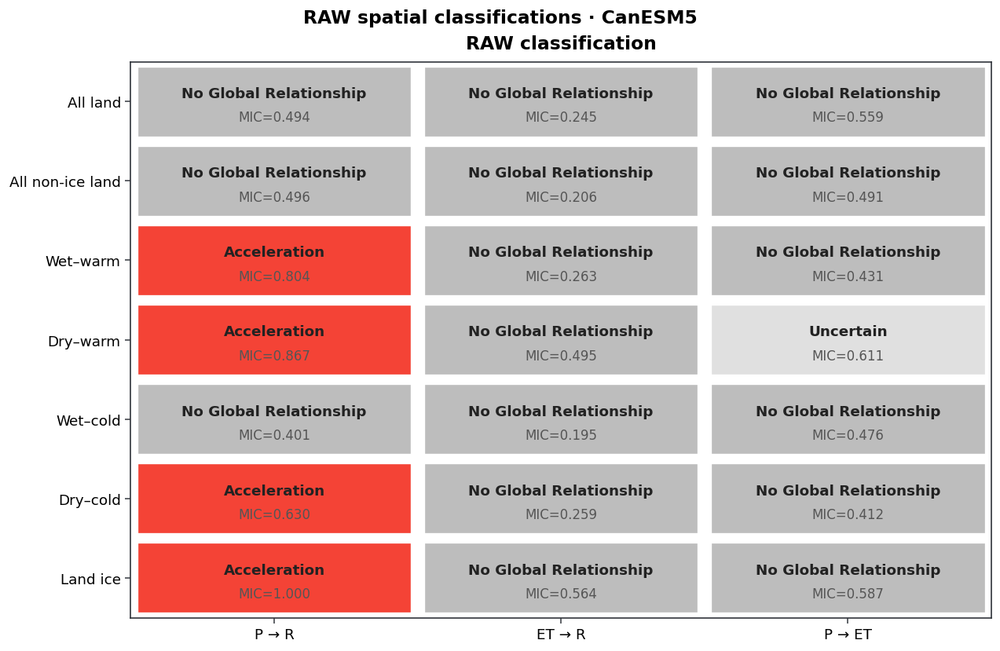

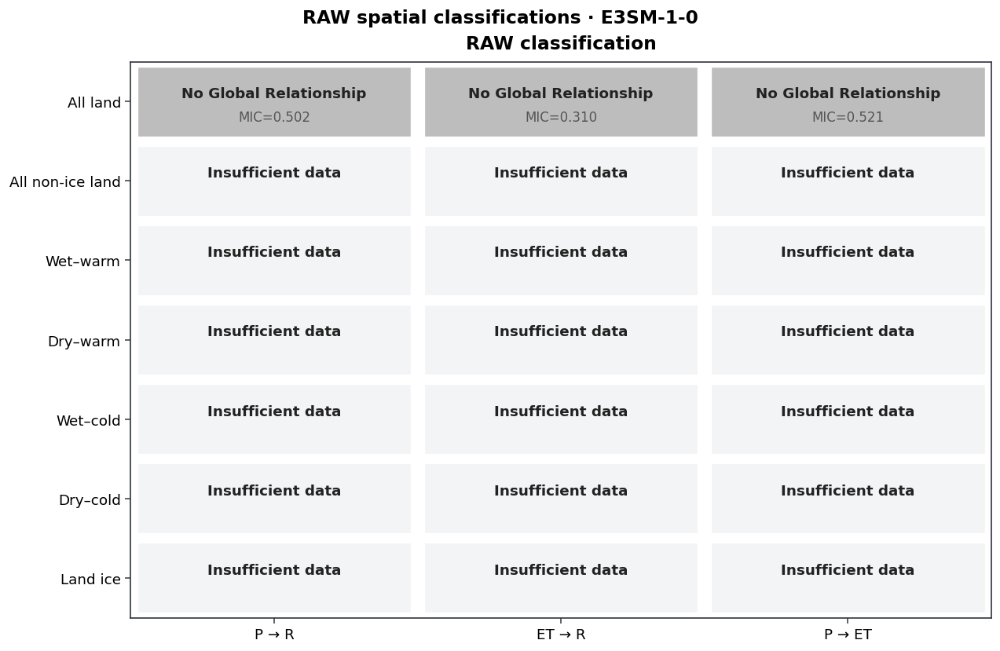

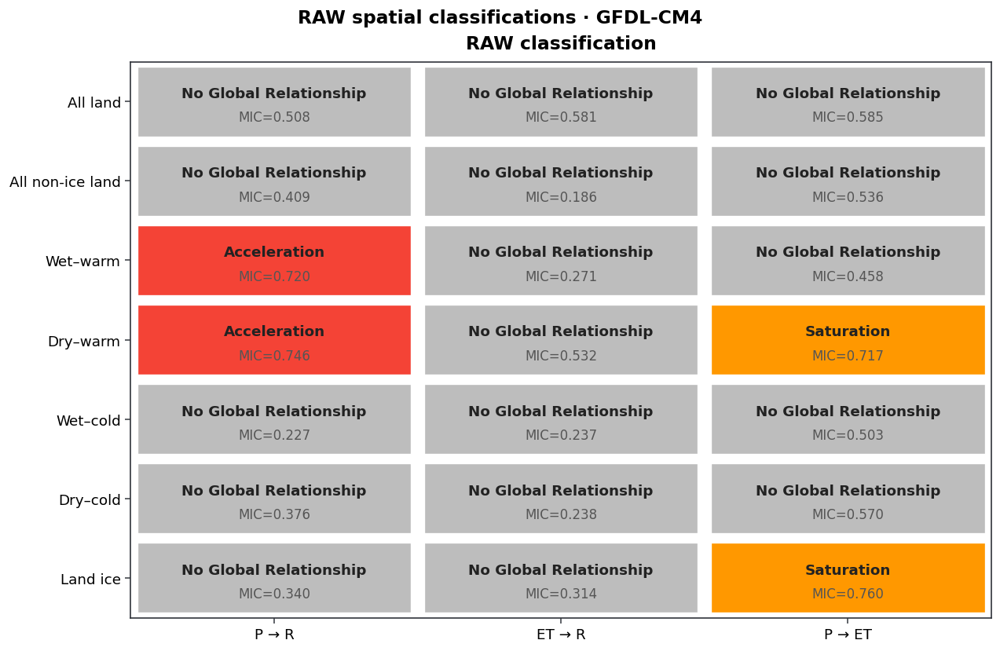

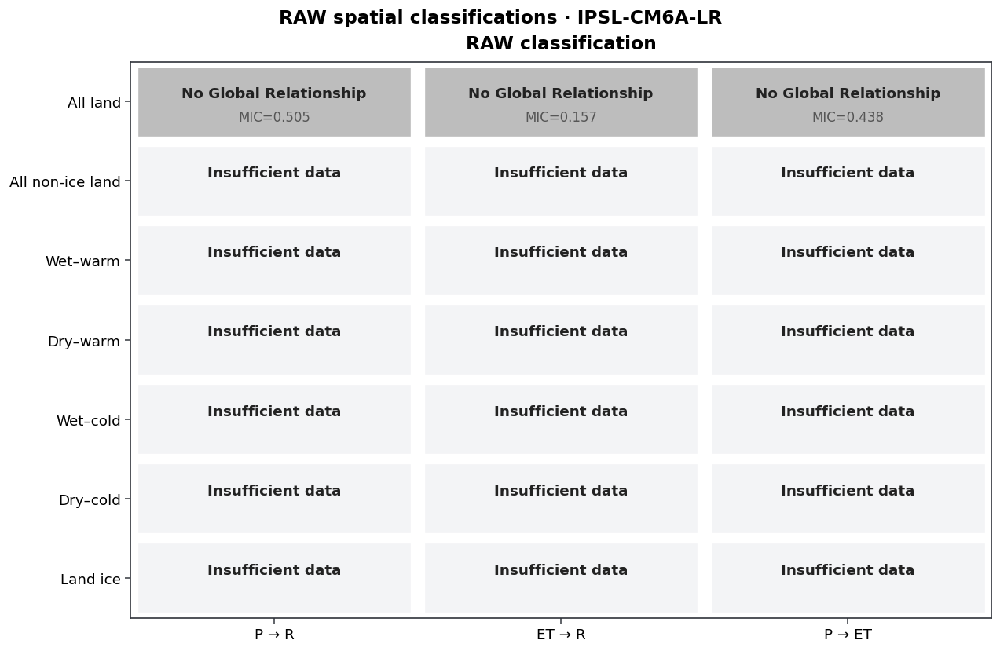

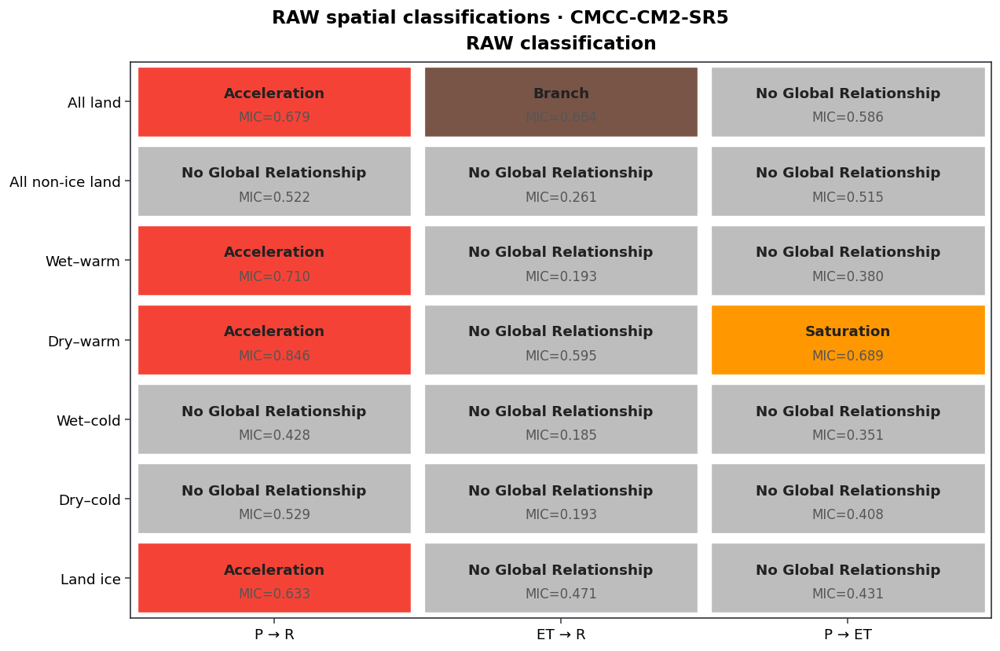

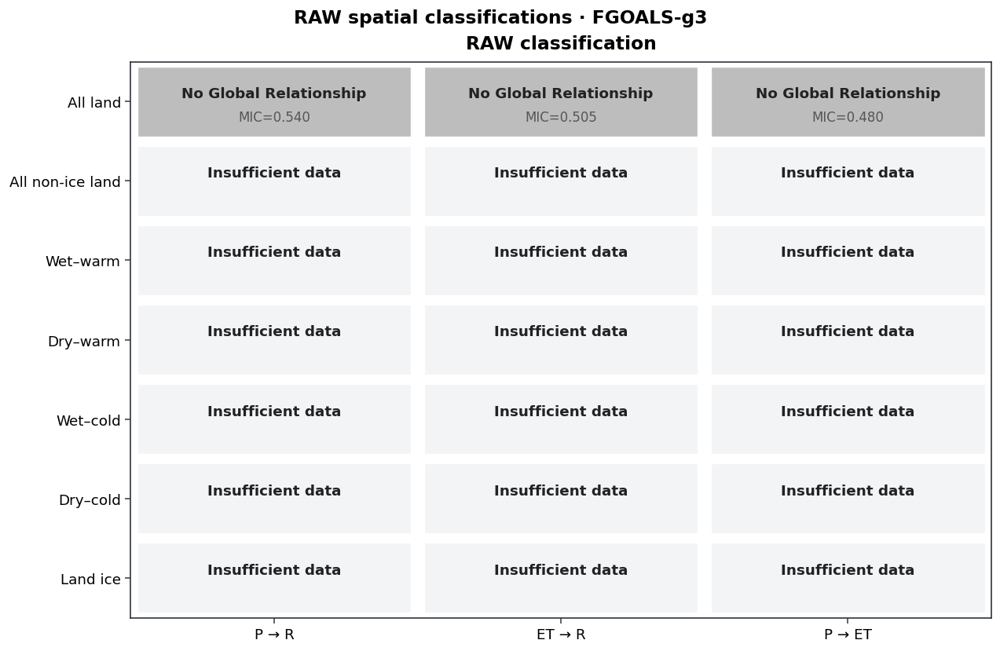

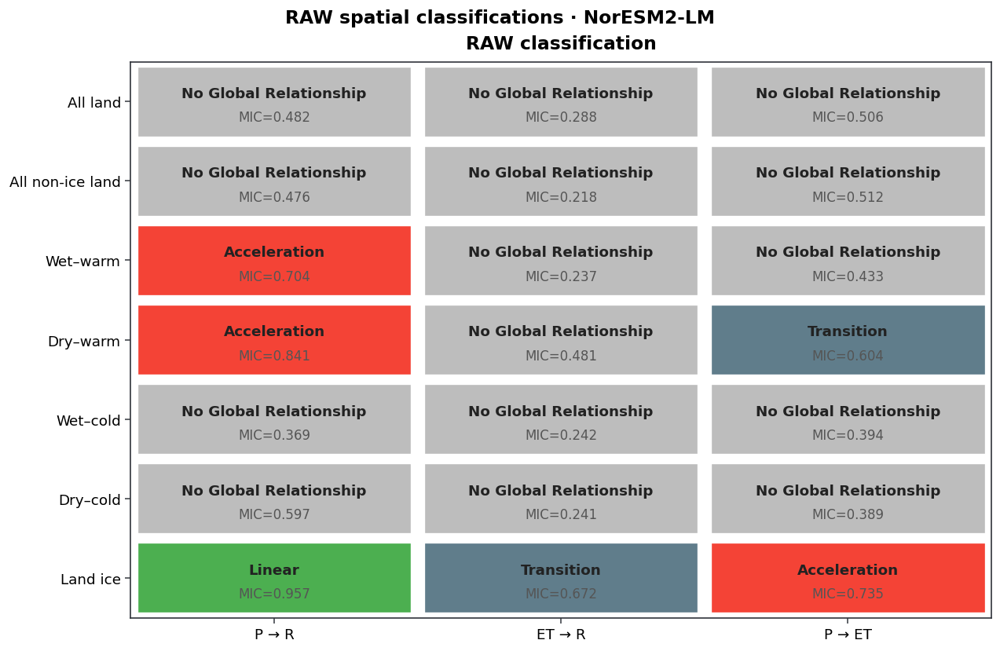

In [12]:
domain_order = [d[0] for d in DOMAINS]
pair_order = [v[2] for v in VARIABLE_PAIRS]
GROUP_COLORS = {
    'Linear': '#4CAF50',
    'Saturation': '#FF9800',
    'Acceleration': '#F44336',
    'U-shape': '#9C27B0',
    'Cubic': '#3F51B5',
    'Oscillation': '#00BCD4',
    'Branch': '#795548',
    'Transition': '#607D8B',
    'No Global Relationship': '#BDBDBD',
    'Uncertain': '#E0E0E0',
    'Insufficient data': '#F3F4F6',
}


def draw_classification_heatmap(ax, result_table, version):
    version_table = result_table.loc[
        (result_table['sample'] == 'all')
        & (result_table['outlier_version'] == version)
    ]
    pivot_group = version_table.pivot_table(
        index='domain', columns='pair', values='group', aggfunc='first',
    ).reindex(index=domain_order, columns=pair_order)
    pivot_mic = version_table.pivot_table(
        index='domain', columns='pair', values='mic', aggfunc='first',
    ).reindex(index=domain_order, columns=pair_order)

    ax.set_xlim(-0.5, len(pair_order) - 0.5)
    ax.set_ylim(-0.5, len(domain_order) - 0.5)
    ax.invert_yaxis()
    ax.set_xticks(range(len(pair_order)))
    ax.set_xticklabels(pair_order)
    ax.set_yticks(range(len(domain_order)))
    ax.set_yticklabels([d[1] for d in DOMAINS])
    for yi, domain in enumerate(domain_order):
        for xi, pair in enumerate(pair_order):
            group_value = pivot_group.loc[domain, pair]
            group = group_value if pd.notna(group_value) else ''
            mic_val = pivot_mic.loc[domain, pair]
            rect = plt.Rectangle(
                (xi - 0.48, yi - 0.45), 0.96, 0.9,
                facecolor=GROUP_COLORS.get(group, '#F5F5F5'),
                edgecolor='white', linewidth=2,
            )
            ax.add_patch(rect)
            ax.text(xi, yi - 0.1, group, ha='center', va='center',
                    fontsize=11, fontweight='semibold', color='#222222')
            if pd.notna(mic_val):
                ax.text(xi, yi + 0.2, f'MIC={mic_val:.3f}',
                        ha='center', va='center', fontsize=10, color='#555555')
    ax.set_title(f'{version.upper()} classification',
                 fontsize=14, fontweight='semibold', pad=10)
    style_axes(ax)
    ax.grid(False)


def draw_heatmap_figure(run, version):
    run_results = RESULTS_DF.loc[
        (RESULTS_DF['model'] == run['model'])
        & (RESULTS_DF['experiment'] == run['experiment'])
        & (RESULTS_DF['member'] == run['member'])
        & (RESULTS_DF['grid'] == run['grid'])
    ]
    fig, ax = plt.subplots(figsize=(10.5, 6.8), constrained_layout=True)
    draw_classification_heatmap(ax, run_results, version)
    fig.suptitle(
        f"{version.upper()} spatial classifications · {run['model']}",
        fontsize=14, fontweight='semibold',
    )
    if WRITE_OUTPUTS:
        fig.savefig(
            run['zones_dir'] / f'S4_classification_heatmap_{version}.png',
            bbox_inches='tight',
        )
    plt.show()
    plt.close(fig)


print('RAW classification heatmaps')
print('=' * 72)
for run in RUNS:
    draw_heatmap_figure(run, 'raw')


## 7b. Classification heatmap — TRIMMED / trimmed分类热力图

Same domain × pair layout as the raw heatmaps, shown only after every model's raw heatmap.

**中文说明：** 与raw热力图布局相同，全部raw热力图完成后再显示。


TRIMMED classification heatmaps


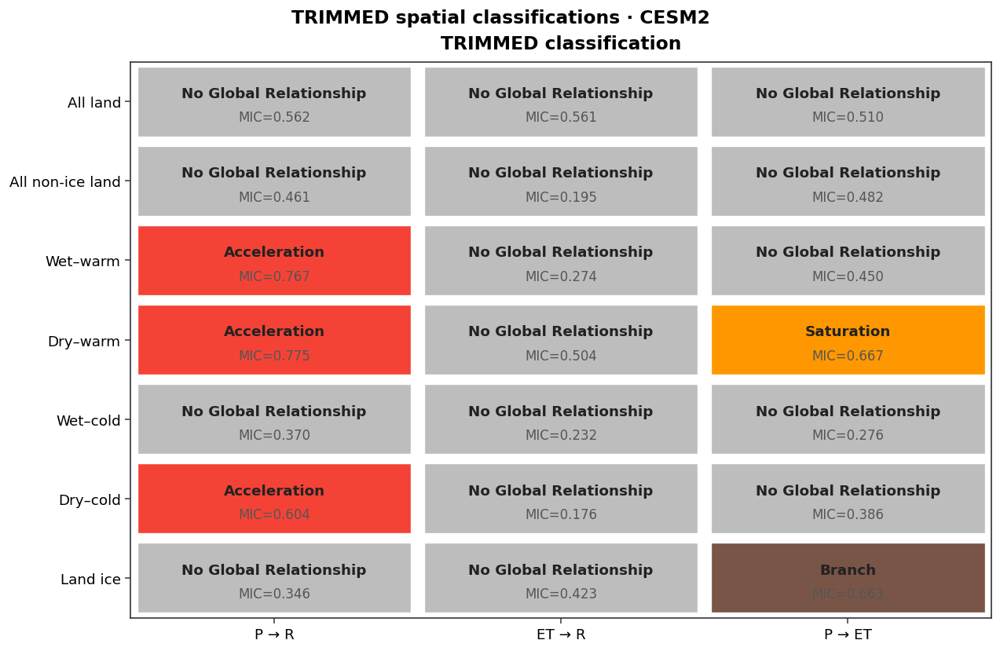

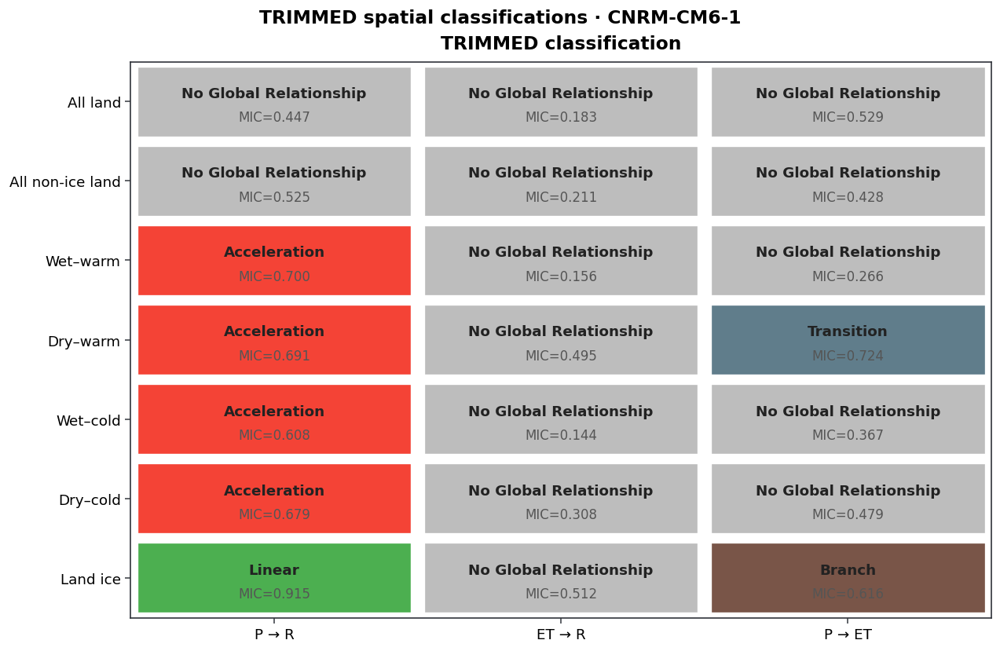

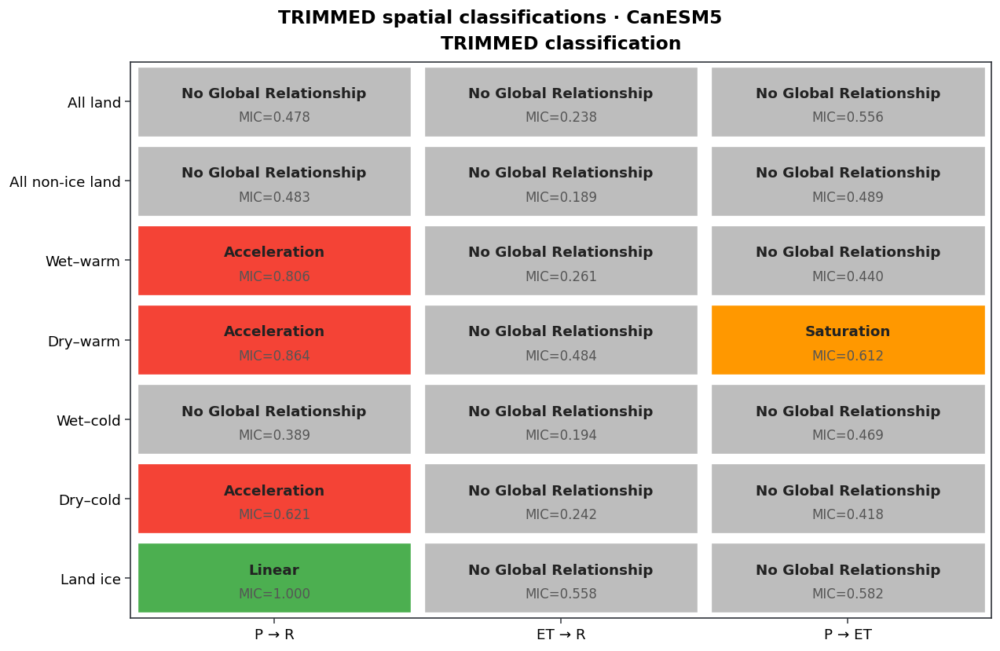

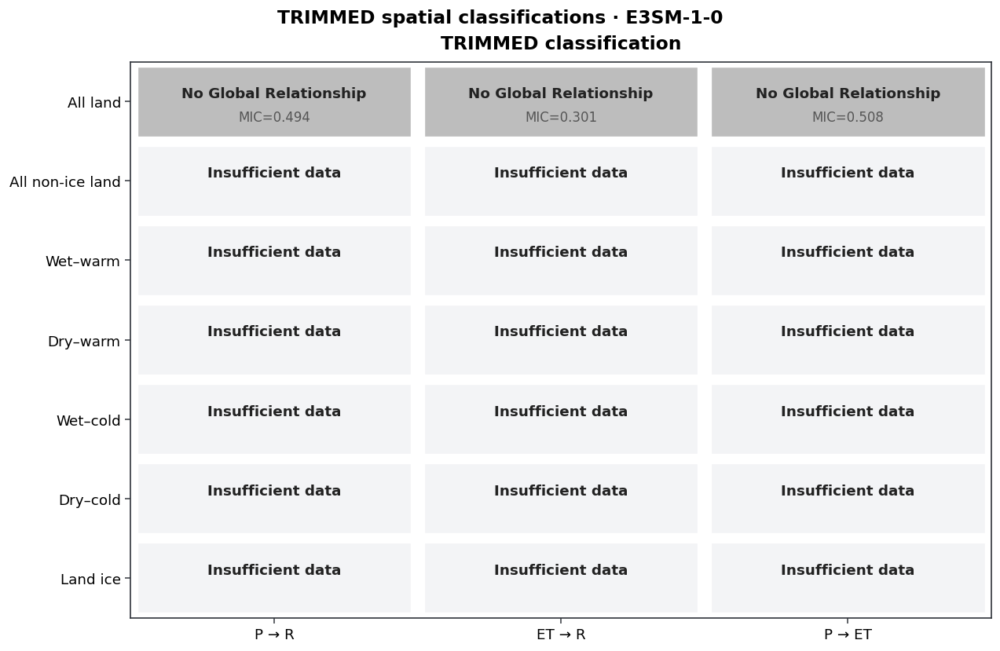

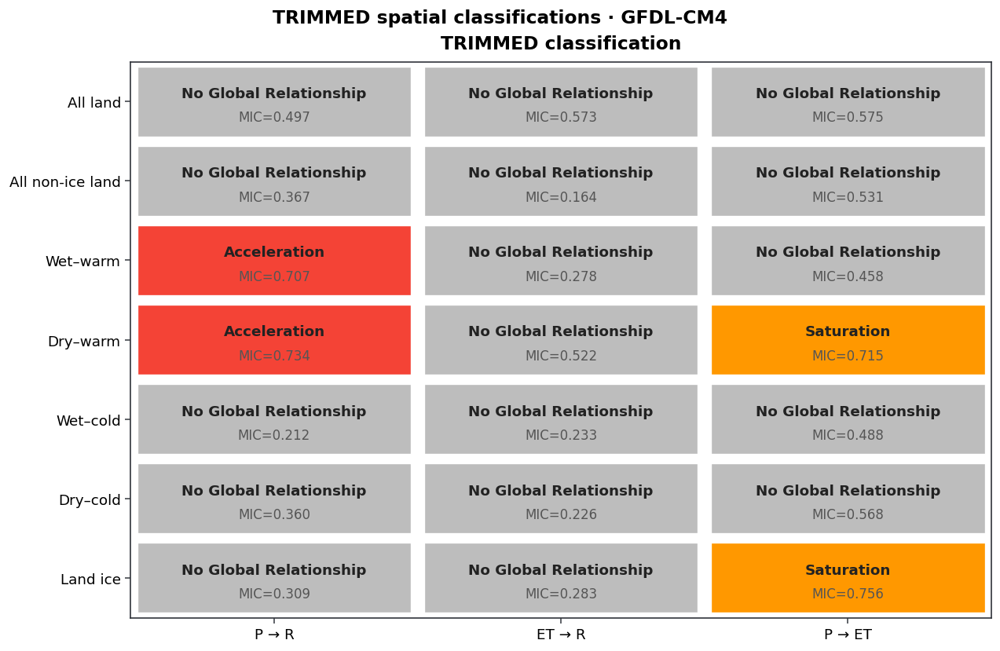

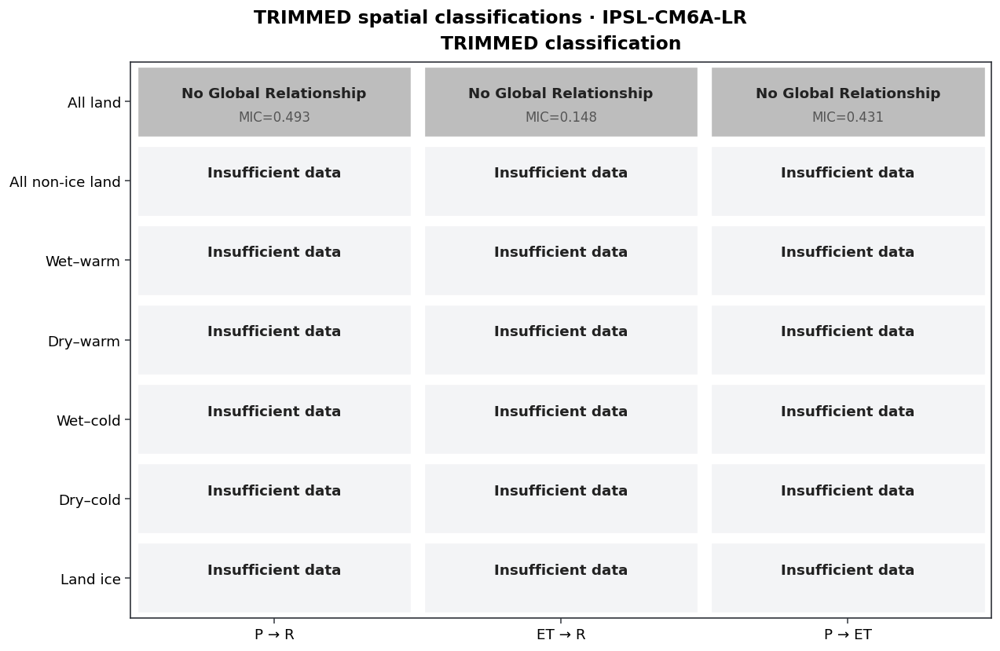

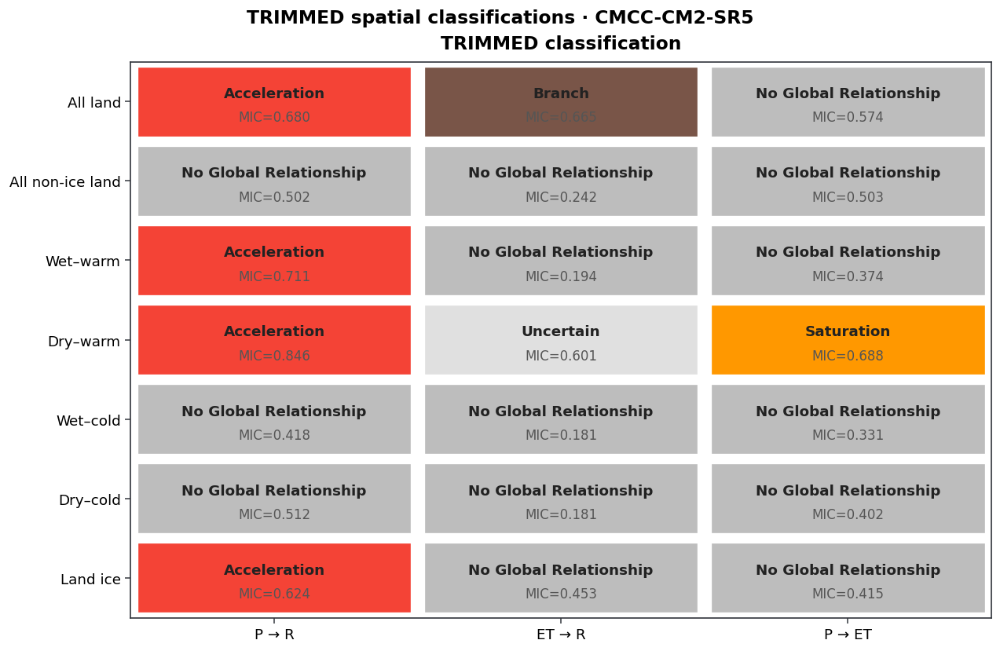

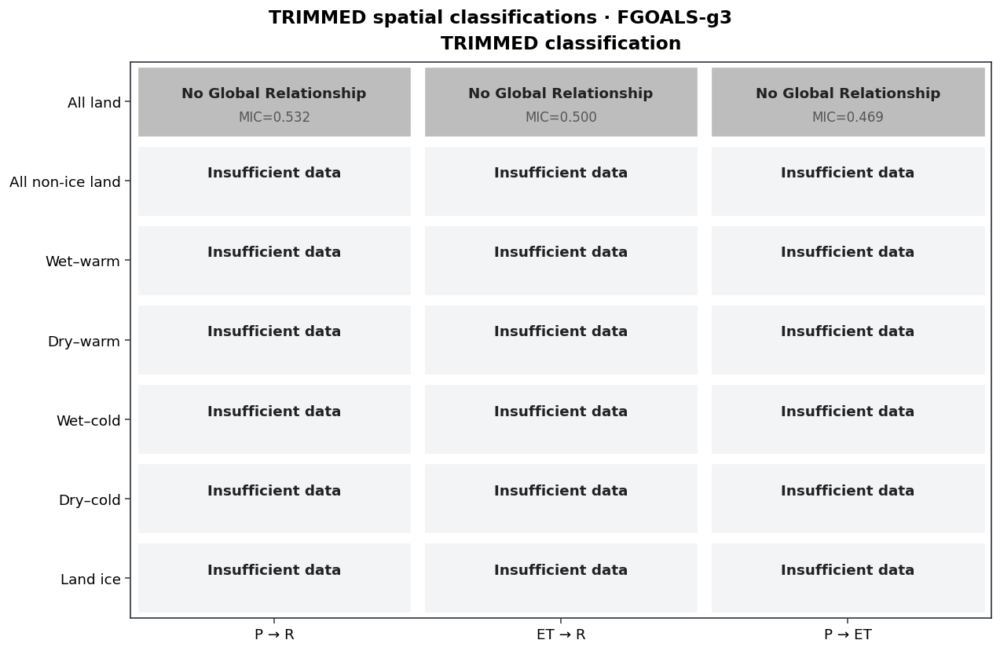

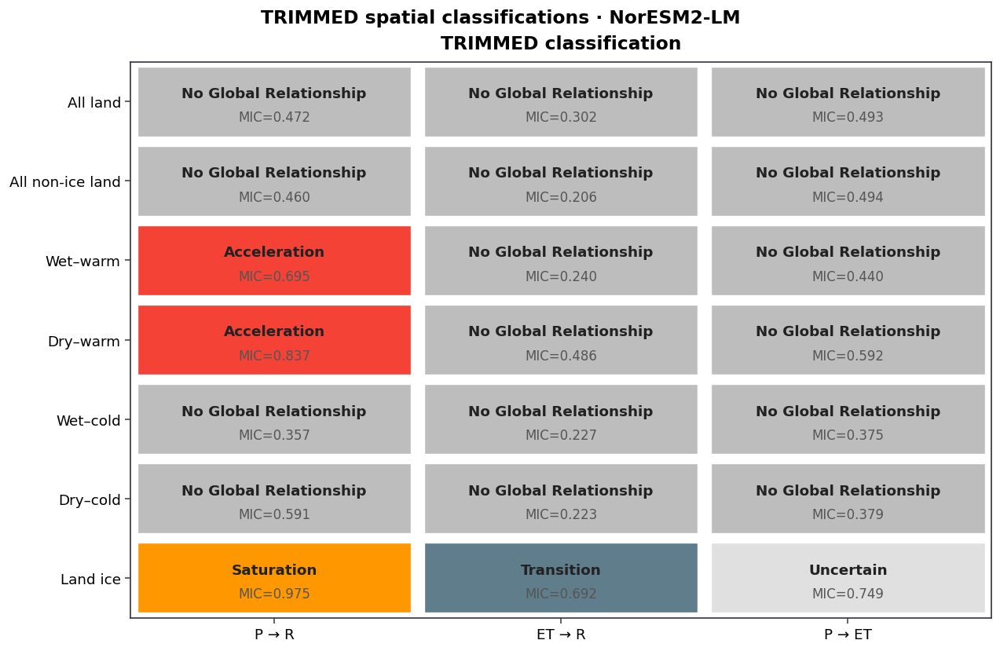

In [13]:
print('TRIMMED classification heatmaps')
print('=' * 72)
for run in RUNS:
    draw_heatmap_figure(run, 'trimmed')


## 8. Sensitivity analysis / 敏感性分析

Two independent sensitivity checks are reported. First, all versus core is compared separately for raw and trimmed data to diagnose boundary mixing. Second, raw versus trimmed is compared for every domain × sample × pair to diagnose dependence on extreme grid cells. Raw remains the primary result.

**中文说明：** 这里分开检查两种敏感性：(1) 在raw和trimmed内部各自比较all与core，用于判断分区边界混合；(2) 对每个domain × sample × pair比较raw与trimmed，用于判断分类是否依赖极端格点。raw始终是主结果。


In [14]:
RUN_KEYS = ['model', 'experiment', 'member', 'grid']
zone_domains = ['WW', 'WD', 'CW', 'CD']

# A. all versus core, evaluated separately inside raw and trimmed.
core_sensitivity_rows = []
for run_key, run_cases in RESULTS_DF.groupby(RUN_KEYS, sort=False):
    run_meta = dict(zip(RUN_KEYS, run_key))
    for version in ['raw', 'trimmed']:
        version_cases = run_cases.loc[run_cases['outlier_version'] == version]
        for domain in zone_domains:
            for x_var, y_var, pair_label in VARIABLE_PAIRS:
                common = (
                    (version_cases['domain'] == domain)
                    & (version_cases['x_var'] == x_var)
                    & (version_cases['y_var'] == y_var)
                )
                all_row = version_cases.loc[common & version_cases['sample'].eq('all')]
                core_row = version_cases.loc[common & version_cases['sample'].eq('core')]
                if len(all_row) != 1 or len(core_row) != 1:
                    continue
                a = all_row.iloc[0]
                c = core_row.iloc[0]
                core_sensitivity_rows.append({
                    **run_meta,
                    'outlier_version': version,
                    'domain': domain,
                    'pair': pair_label,
                    'all_n': a['n_cells'],
                    'all_group': a['group'],
                    'all_mic': a['mic'],
                    'core_n': c['n_cells'],
                    'core_group': c['group'],
                    'core_mic': c['mic'],
                    'consistent': a['group'] == c['group'],
                })

core_sensitivity_df = pd.DataFrame(core_sensitivity_rows)
print('\n=== A. All vs core sensitivity ===')
for _, _, pair_label in VARIABLE_PAIRS:
    print(f'\n--- {pair_label} ---')
    display(core_sensitivity_df.loc[
        core_sensitivity_df['pair'] == pair_label,
        ['domain', 'outlier_version', 'all_n', 'all_group', 'all_mic',
         'core_n', 'core_group', 'core_mic', 'consistent'],
    ].round(4))

# B. raw versus trimmed for every exact domain × sample × pair.
outlier_sensitivity_rows = []
unit_cols = RUN_KEYS + ['domain', 'sample', 'x_var', 'y_var', 'pair']
for unit_key, unit_cases in RESULTS_DF.groupby(unit_cols, sort=False):
    unit_meta = dict(zip(unit_cols, unit_key))
    raw_row = unit_cases.loc[unit_cases['outlier_version'] == 'raw']
    trimmed_row = unit_cases.loc[unit_cases['outlier_version'] == 'trimmed']
    if len(raw_row) != 1 or len(trimmed_row) != 1:
        continue
    raw = raw_row.iloc[0]
    trimmed = trimmed_row.iloc[0]
    outlier_sensitivity_rows.append({
        **unit_meta,
        'raw_n': raw['n_cells'],
        'trimmed_n': trimmed['n_cells'],
        'n_removed': trimmed['n_removed'],
        'removed_fraction': trimmed['removed_fraction'],
        'raw_mic': raw.get('mic', np.nan),
        'trimmed_mic': trimmed.get('mic', np.nan),
        'raw_pearson': raw.get('pearson_r_descriptive', np.nan),
        'trimmed_pearson': trimmed.get('pearson_r_descriptive', np.nan),
        'raw_power_r2': raw.get('power_r2', np.nan),
        'trimmed_power_r2': trimmed.get('power_r2', np.nan),
        'raw_power_b': raw.get('power_b', np.nan),
        'trimmed_power_b': trimmed.get('power_b', np.nan),
        'raw_group': raw['group'],
        'trimmed_group': trimmed['group'],
        'consistent': raw['group'] == trimmed['group'],
    })

outlier_sensitivity_df = pd.DataFrame(outlier_sensitivity_rows)
print('\n=== B. Raw vs trimmed outlier sensitivity ===')
outlier_display_cols = [
    'domain', 'sample', 'raw_n', 'trimmed_n', 'n_removed',
    'removed_fraction', 'raw_mic', 'trimmed_mic',
    'raw_pearson', 'trimmed_pearson',
    'raw_power_r2', 'trimmed_power_r2',
    'raw_power_b', 'trimmed_power_b',
    'raw_group', 'trimmed_group', 'consistent',
]
for _, _, pair_label in VARIABLE_PAIRS:
    print(f'\n--- {pair_label} ---')
    display(outlier_sensitivity_df.loc[
        outlier_sensitivity_df['pair'] == pair_label,
        outlier_display_cols,
    ].round(4))

n_changed = int((~outlier_sensitivity_df['consistent']).sum())
print(f'\nRaw/trimmed classification changes: {n_changed} / {len(outlier_sensitivity_df)}')
if n_changed > 0:
    display(outlier_sensitivity_df.loc[
        ~outlier_sensitivity_df['consistent'],
        ['domain', 'sample', 'pair', 'raw_group', 'trimmed_group',
         'removed_fraction'],
    ].round(4))


=== A. All vs core sensitivity ===

--- P → R ---


,domain,outlier_version,all_n,all_group,all_mic,core_n,core_group,core_mic,consistent
0,WW,raw,2410,Acceleration,0.7703,2297,Acceleration,0.7734,True
3,WD,raw,4177,Acceleration,0.7843,4020,Acceleration,0.7867,True
6,CW,raw,4642,No Global Relationship,0.3920,4521,No Global Relationship,0.3857,True
9,CD,raw,2325,Acceleration,0.6184,2161,Acceleration,0.6149,True
12,WW,trimmed,2336,Acceleration,0.7670,2229,Acceleration,0.7679,True
...,...,...,...,...,...,...,...,...,...
201,CD,raw,592,No Global Relationship,0.5972,535,Acceleration,0.6171,False
204,WW,trimmed,700,Acceleration,0.6947,651,Acceleration,0.6937,True
207,WD,trimmed,1111,Acceleration,0.8371,1060,Acceleration,0.8428,True
210,CW,trimmed,1185,No Global Relationship,0.3568,1147,No Global Relationship,0.3528,True



--- ET → R ---


,domain,outlier_version,all_n,all_group,all_mic,core_n,core_group,core_mic,consistent
1,WW,raw,2410,No Global Relationship,0.2674,2297,No Global Relationship,0.2732,True
4,WD,raw,4177,No Global Relationship,0.5046,4020,No Global Relationship,0.5060,True
7,CW,raw,4642,No Global Relationship,0.2428,4521,No Global Relationship,0.2470,True
10,CD,raw,2325,No Global Relationship,0.1837,2161,No Global Relationship,0.1977,True
13,WW,trimmed,2311,No Global Relationship,0.2737,2206,No Global Relationship,0.2833,True
...,...,...,...,...,...,...,...,...,...
202,CD,raw,592,No Global Relationship,0.2407,535,No Global Relationship,0.2436,True
205,WW,trimmed,691,No Global Relationship,0.2399,644,No Global Relationship,0.2439,True
208,WD,trimmed,1102,No Global Relationship,0.4863,1052,No Global Relationship,0.4917,True
211,CW,trimmed,1182,No Global Relationship,0.2269,1144,No Global Relationship,0.2287,True



--- P → ET ---


,domain,outlier_version,all_n,all_group,all_mic,core_n,core_group,core_mic,consistent
2,WW,raw,2410,No Global Relationship,0.4481,2297,No Global Relationship,0.4696,True
5,WD,raw,4177,Transition,0.6675,4020,Transition,0.6764,True
8,CW,raw,4642,No Global Relationship,0.2976,4521,No Global Relationship,0.2982,True
11,CD,raw,2325,No Global Relationship,0.3889,2161,No Global Relationship,0.4133,True
14,WW,trimmed,2318,No Global Relationship,0.4498,2212,No Global Relationship,0.4697,True
...,...,...,...,...,...,...,...,...,...
203,CD,raw,592,No Global Relationship,0.3885,535,No Global Relationship,0.4041,True
206,WW,trimmed,692,No Global Relationship,0.4397,644,No Global Relationship,0.4472,True
209,WD,trimmed,1110,No Global Relationship,0.5920,1059,Uncertain,0.6060,False
212,CW,trimmed,1188,No Global Relationship,0.3746,1149,No Global Relationship,0.3723,True



=== B. Raw vs trimmed outlier sensitivity ===

--- P → R ---


,domain,sample,raw_n,trimmed_n,n_removed,removed_fraction,raw_mic,trimmed_mic,raw_pearson,trimmed_pearson,raw_power_r2,trimmed_power_r2,raw_power_b,trimmed_power_b,raw_group,trimmed_group,consistent
4,CD,all,2325,2247,78,0.0335,0.6184,0.6040,0.8117,0.8113,0.6753,0.6636,1.3614,1.2762,Acceleration,Acceleration,True
5,CD,core,2161,2089,72,0.0333,0.6149,0.5993,0.7929,0.7983,0.6462,NaN,1.3961,NaN,Acceleration,No Global Relationship,False
10,CW,all,4642,4494,148,0.0319,0.3920,0.3696,0.8431,0.7652,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
11,CW,core,4521,4375,146,0.0323,0.3857,0.3646,0.8344,0.7576,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
14,LI,all,7022,6801,221,0.0315,0.3656,0.3464,0.8528,0.7296,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,WD,core,1096,1060,36,0.0328,0.8557,0.8428,0.8997,0.8975,0.8896,0.8704,1.8551,1.8035,Acceleration,Acceleration,True
289,WW,all,723,700,23,0.0318,0.7044,0.6947,0.9359,0.9275,0.8969,0.8800,1.5936,1.6442,Acceleration,Acceleration,True
290,WW,core,672,651,21,0.0312,0.7027,0.6937,0.9373,0.9294,0.9006,0.8842,1.6206,1.6673,Acceleration,Acceleration,True
293,all_land,all,5701,5517,184,0.0323,0.4817,0.4720,0.8017,0.7809,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True



--- ET → R ---


,domain,sample,raw_n,trimmed_n,n_removed,removed_fraction,raw_mic,trimmed_mic,raw_pearson,trimmed_pearson,raw_power_r2,trimmed_power_r2,raw_power_b,trimmed_power_b,raw_group,trimmed_group,consistent
0,CD,all,2325,2241,84,0.0361,0.1837,0.1765,0.0179,0.2029,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
1,CD,core,2161,2085,76,0.0352,0.1977,0.1867,-0.0217,0.1706,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
6,CW,all,4642,4471,171,0.0368,0.2428,0.2324,0.0940,-0.0730,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
7,CW,core,4521,4354,167,0.0369,0.2470,0.2380,0.0758,-0.0810,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
12,LI,all,7022,6767,255,0.0363,0.4442,0.4231,0.6841,0.5871,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,WD,core,1096,1052,44,0.0401,0.4912,0.4917,0.4115,0.4428,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
285,WW,all,723,691,32,0.0443,0.2370,0.2399,0.3042,0.3304,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
286,WW,core,672,644,28,0.0417,0.2388,0.2439,0.2984,0.3273,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
291,all_land,all,5701,5475,226,0.0396,0.2882,0.3016,0.3408,0.3563,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True



--- P → ET ---


,domain,sample,raw_n,trimmed_n,n_removed,removed_fraction,raw_mic,trimmed_mic,raw_pearson,trimmed_pearson,raw_power_r2,trimmed_power_r2,raw_power_b,trimmed_power_b,raw_group,trimmed_group,consistent
2,CD,all,2325,2235,90,0.0387,0.3889,0.3859,0.5329,0.6106,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
3,CD,core,2161,2080,81,0.0375,0.4133,0.4026,0.5252,0.6101,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
8,CW,all,4642,4490,152,0.0327,0.2976,0.2757,0.5789,0.5379,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
9,CW,core,4521,4371,150,0.0332,0.2982,0.2767,0.5760,0.5407,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
13,LI,all,7022,6766,256,0.0365,0.6685,0.6632,0.7545,0.6807,0.5701,NaN,0.9464,NaN,Linear,Branch,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,WD,core,1096,1059,37,0.0338,0.6141,0.6060,0.6275,0.6344,NaN,NaN,NaN,NaN,Uncertain,Uncertain,True
287,WW,all,723,692,31,0.0429,0.4333,0.4397,0.5304,0.5565,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
288,WW,core,672,644,28,0.0417,0.4329,0.4472,0.5230,0.5505,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True
292,all_land,all,5701,5473,228,0.0400,0.5058,0.4929,0.7538,0.7666,NaN,NaN,NaN,NaN,No Global Relationship,No Global Relationship,True



Raw/trimmed classification changes: 14 / 297


,domain,sample,pair,raw_group,trimmed_group,removed_fraction
5,CD,core,P → R,Acceleration,No Global Relationship,0.0333
13,LI,all,P → ET,Linear,Branch,0.0365
17,WD,all,P → ET,Transition,Saturation,0.0316
18,WD,core,P → ET,Transition,Saturation,0.0321
48,WD,all,ET → R,No Global Relationship,Uncertain,0.0408
49,WD,core,ET → R,U-shape,Uncertain,0.0404
79,LI,all,P → ET,Saturation,Branch,0.0377
113,LI,all,P → R,Acceleration,Linear,0.0292
116,WD,all,P → ET,Uncertain,Saturation,0.0394
117,WD,core,P → ET,Uncertain,Saturation,0.0358


## 9. Save results / 保存结果

Save the full raw/trimmed classification table, the all/core comparison, and the raw/trimmed outlier-sensitivity comparison.

**中文说明：** 保存包含raw/trimmed的完整分类结果表、all/core敏感性表和raw/trimmed极值敏感性表。


In [15]:
for run in RUNS:
    output_dir = run['zones_dir']
    period = f'{START_YEAR}_{END_YEAR}'

    if not WRITE_OUTPUTS:
        print(f"WRITE_OUTPUTS=False, skipping save for {run['model']}")
        continue

    run_results = RESULTS_DF.loc[
        (RESULTS_DF['model'] == run['model'])
        & (RESULTS_DF['experiment'] == run['experiment'])
        & (RESULTS_DF['member'] == run['member'])
        & (RESULTS_DF['grid'] == run['grid'])
    ].copy()

    results_path = output_dir / f'S4_classification_results_{period}.csv'
    run_results.to_csv(results_path, index=False)

    core_sens_path = output_dir / f'S4_core_sensitivity_{period}.csv'
    run_core_sensitivity = core_sensitivity_df.loc[
        (core_sensitivity_df['model'] == run['model'])
        & (core_sensitivity_df['experiment'] == run['experiment'])
        & (core_sensitivity_df['member'] == run['member'])
        & (core_sensitivity_df['grid'] == run['grid'])
    ]
    run_core_sensitivity.to_csv(core_sens_path, index=False)

    outlier_sens_path = output_dir / f'S4_outlier_sensitivity_{period}.csv'
    run_outlier_sensitivity = outlier_sensitivity_df.loc[
        (outlier_sensitivity_df['model'] == run['model'])
        & (outlier_sensitivity_df['experiment'] == run['experiment'])
        & (outlier_sensitivity_df['member'] == run['member'])
        & (outlier_sensitivity_df['grid'] == run['grid'])
    ]
    run_outlier_sensitivity.to_csv(outlier_sens_path, index=False)

    outputs = [results_path, core_sens_path, outlier_sens_path]
    figures = sorted(output_dir.glob('S4_*.png'))
    all_outputs = outputs + figures
    manifest = pd.DataFrame([{
        'product': p.name,
        'size_MB': p.stat().st_size / 1e6,
    } for p in all_outputs])
    display(manifest.round({'size_MB': 3}))

pair_figs = sorted(PAIR_FIGURE_DIR.glob('S4_*')) if 'PAIR_FIGURE_DIR' in globals() else []
if pair_figs:
    print('\nPair-level summaries:')
    display(pd.DataFrame([
        {'product': f.name, 'size_MB': f.stat().st_size / 1e6}
        for f in pair_figs
    ]).round({'size_MB': 3}))
print('S4 completed successfully.')


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.022
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.007
3,S4_classification_heatmap_raw.png,0.177
4,S4_classification_heatmap_trimmed.png,0.177
5,S4_relationships_raw.png,2.407
6,S4_relationships_trimmed.png,2.646


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.024
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.007
3,S4_classification_heatmap_raw.png,0.186
4,S4_classification_heatmap_trimmed.png,0.185
5,S4_relationships_raw.png,2.131
6,S4_relationships_trimmed.png,2.296


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.022
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.007
3,S4_classification_heatmap_raw.png,0.178
4,S4_classification_heatmap_trimmed.png,0.180
5,S4_relationships_raw.png,1.523
6,S4_relationships_trimmed.png,1.659


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.009
1,S4_core_sensitivity_1985_2014.csv,0.002
2,S4_outlier_sensitivity_1985_2014.csv,0.004
3,S4_classification_heatmap_raw.png,0.110
4,S4_classification_heatmap_trimmed.png,0.111
5,S4_relationships_raw.png,0.855
6,S4_relationships_trimmed.png,0.921


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.022
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.007
3,S4_classification_heatmap_raw.png,0.174
4,S4_classification_heatmap_trimmed.png,0.175
5,S4_relationships_raw.png,2.656
6,S4_relationships_trimmed.png,2.894


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.010
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.004
3,S4_classification_heatmap_raw.png,0.112
4,S4_classification_heatmap_trimmed.png,0.112
5,S4_relationships_raw.png,0.513
6,S4_relationships_trimmed.png,0.552


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.023
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.007
3,S4_classification_heatmap_raw.png,0.187
4,S4_classification_heatmap_trimmed.png,0.181
5,S4_relationships_raw.png,2.147
6,S4_relationships_trimmed.png,2.374


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.009
1,S4_core_sensitivity_1985_2014.csv,0.002
2,S4_outlier_sensitivity_1985_2014.csv,0.004
3,S4_classification_heatmap_raw.png,0.112
4,S4_classification_heatmap_trimmed.png,0.112
5,S4_relationships_raw.png,0.580
6,S4_relationships_trimmed.png,0.626


,product,size_MB
0,S4_classification_results_1985_2014.csv,0.022
1,S4_core_sensitivity_1985_2014.csv,0.003
2,S4_outlier_sensitivity_1985_2014.csv,0.007
3,S4_classification_heatmap_raw.png,0.174
4,S4_classification_heatmap_trimmed.png,0.172
5,S4_relationships_raw.png,2.270
6,S4_relationships_trimmed.png,2.413



Pair-level summaries:


,product,size_MB
0,S4_modelgrid_ET_R_raw.png,1.462
1,S4_modelgrid_ET_R_trimmed.png,1.680
2,S4_modelgrid_P_ET_raw.png,2.140
3,S4_modelgrid_P_ET_trimmed.png,2.378
4,S4_modelgrid_P_R_raw.png,1.154
5,S4_modelgrid_P_R_trimmed.png,1.318
6,S4_overlay_ET_R_raw.png,1.077
7,S4_overlay_ET_R_trimmed.png,1.204
8,S4_overlay_P_ET_raw.png,1.432
9,S4_overlay_P_ET_trimmed.png,1.584


S4 completed successfully.
